In [87]:
import phik
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil 
from sklearn.manifold import TSNE
import numpy as np 
from kmodes.kprototypes import KPrototypes
sns.set()

In [88]:
data = pd.read_csv('Company_Employee.csv')
data

,Age,Gender,BusinessTravel,Job Function,Distance Between Company and Home (KM),"Education (1 is lowest, 5 is highest)","Job Satisfaction (1 is lowest, 4 is highest)",MaritalStatus,Salary ($),"Performance Rating (1 is lowest, 4 is highest)","Work Life Balance (1 is worst, 4 is best)",Length of Service (Years),Resign Status
0,41,Female,Travel_Rarely,Sales,1,2,4,Single,5993,3,1,6,Yes
1,49,Male,Travel_Frequently,Research & Development,8,1,2,Married,5130,4,3,10,No
2,37,Male,Travel_Rarely,Research & Development,2,2,3,Single,2090,3,3,0,Yes
3,33,Female,Travel_Frequently,Research & Development,3,4,3,Married,2909,3,3,8,No
4,27,Male,Travel_Rarely,Research & Development,2,1,2,Married,3468,3,3,2,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,Male,Travel_Frequently,Research & Development,23,2,4,Married,2571,3,3,5,No
1466,39,Male,Travel_Rarely,Research & Development,6,1,1,Married,9991,3,3,7,No
1467,27,Male,Travel_Rarely,Research & Development,4,3,2,Married,6142,4,3,6,No
1468,49,Male,Travel_Frequently,Sales,2,3,2,Married,5390,3,2,9,No


In [89]:
data.columns = pd.Series(data.columns).astype('string').str.replace('[(].*[)]' , '' , regex = True).str.strip()

In [90]:
for col in data.columns:
    print("unique values for column" , col)
    print(data[col].unique() )
    print('\n\n\n')

unique values for column Age
[41 49 37 33 27 32 59 30 38 36 35 29 31 34 28 22 53 24 21 42 44 46 39 43
 50 26 48 55 45 56 23 51 40 54 58 20 25 19 57 52 47 18 60]




unique values for column Gender
['Female' 'Male']




unique values for column BusinessTravel
['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']




unique values for column Job Function
['Sales' 'Research & Development' 'Human Resources']




unique values for column Distance Between Company and Home
[ 1  8  2  3 24 23 27 16 15 26 19 21  5 11  9  7  6 10  4 25 12 18 29 22
 14 20 28 17 13]




unique values for column Education
[2 1 4 3 5]




unique values for column Job Satisfaction
[4 2 3 1]




unique values for column MaritalStatus
['Single' 'Married' 'Divorced']




unique values for column Salary
[5993 5130 2090 ... 9991 5390 4404]




unique values for column Performance Rating
[3 4]




unique values for column Work Life Balance
[1 3 2 4]




unique values for column Length of Service
[ 6 10  0  8  2  7  1  9  5  4

### Data types are a mix of numerical and categorical types 
- numerical columns are age , distance , salary and length of service
- ordinal columns are education , job statisfaction, performance rating and work life balance
- nominal columns are Gender ,	BusinessTravel 	,Job Function and resign status
- This makes the clustering task more challenging as algorithms like kmeans works best for continouous numerical data 

In [91]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 13 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   Age                                1470 non-null   int64 
 1   Gender                             1470 non-null   object
 2   BusinessTravel                     1470 non-null   object
 3   Job Function                       1470 non-null   object
 4   Distance Between Company and Home  1470 non-null   int64 
 5   Education                          1470 non-null   int64 
 6   Job Satisfaction                   1470 non-null   int64 
 7   MaritalStatus                      1470 non-null   object
 8   Salary                             1470 non-null   int64 
 9   Performance Rating                 1470 non-null   int64 
 10  Work Life Balance                  1470 non-null   int64 
 11  Length of Service                  1470 non-null   int64 
 12  Resign

### Checking for Null Values

In [178]:
data.isnull().sum()

Age                                  0
Gender                               0
BusinessTravel                       0
Job Function                         0
Distance Between Company and Home    0
Education                            0
Job Satisfaction                     0
MaritalStatus                        0
Salary                               0
Performance Rating                   0
Work Life Balance                    0
Length of Service                    0
Resign Status                        0
dtype: int64

- Dataset is 

### Setting the columns types

In [93]:
continuouscols = ['Age' , 'Distance Between Company and Home' , 'Salary', 'Length of Service']
discretecols = list(set(data.columns) - set(continuouscols))


gowercatcols = ['Gender' , 'BusinessTravel' , 'Job Function' , 'MaritalStatus' ,  'Resign Status']
gowercontinouscols = list(set(data.columns) - set(gowercatcols) )

In [94]:
# pairplot of data

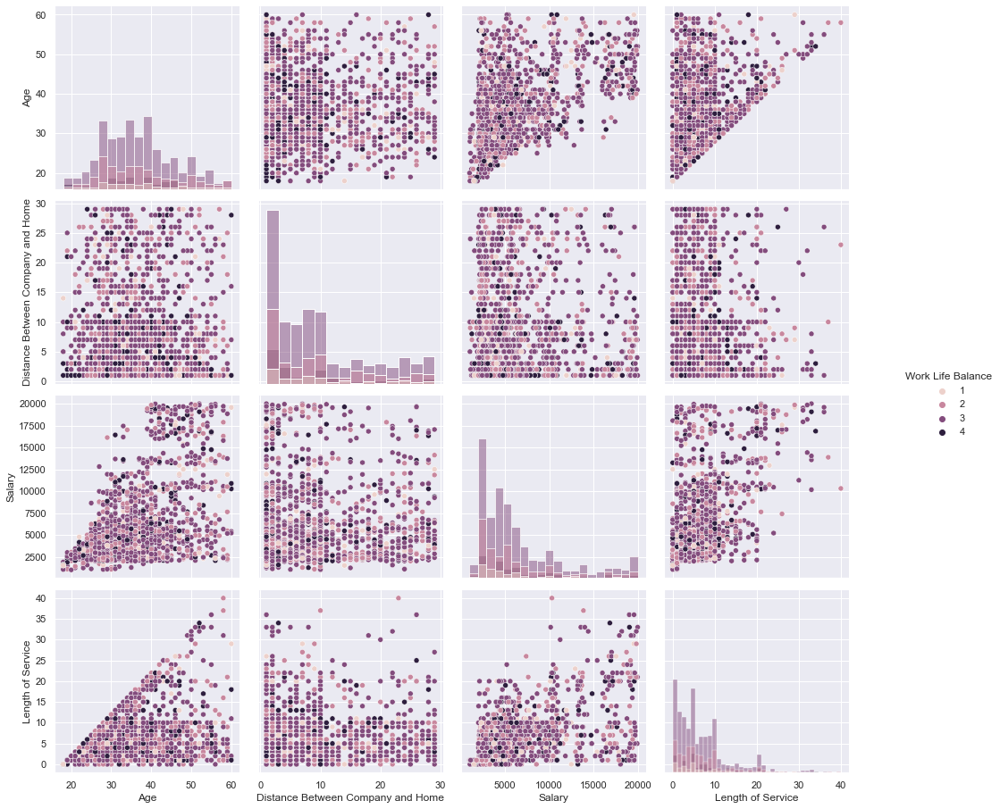

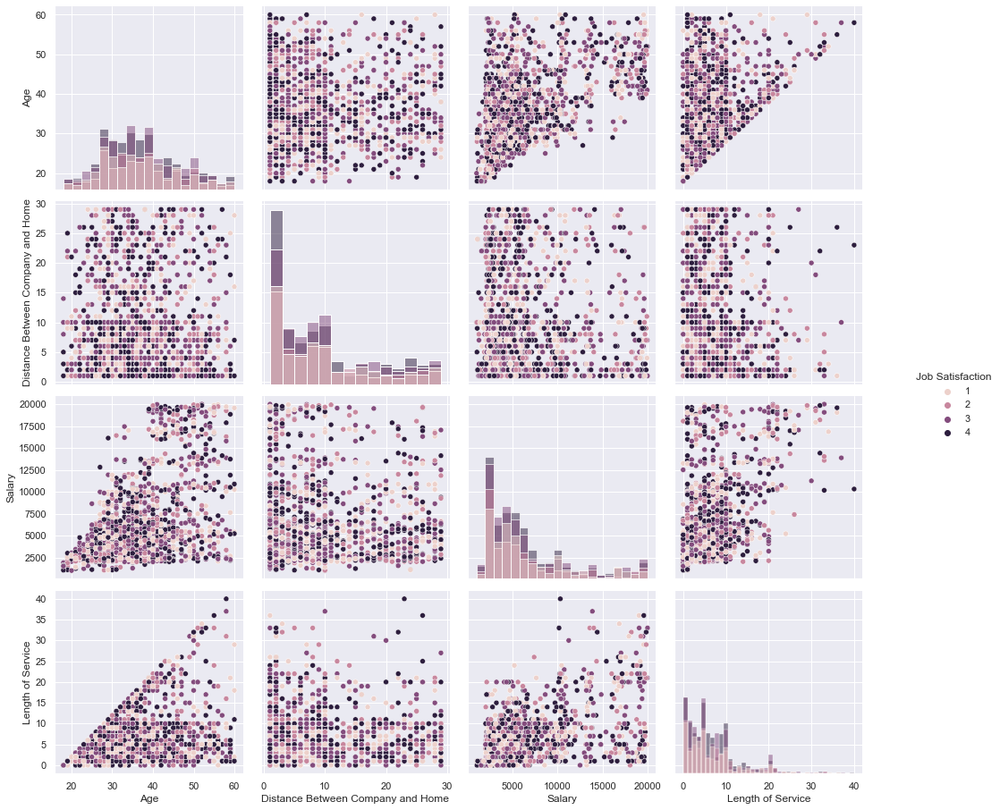

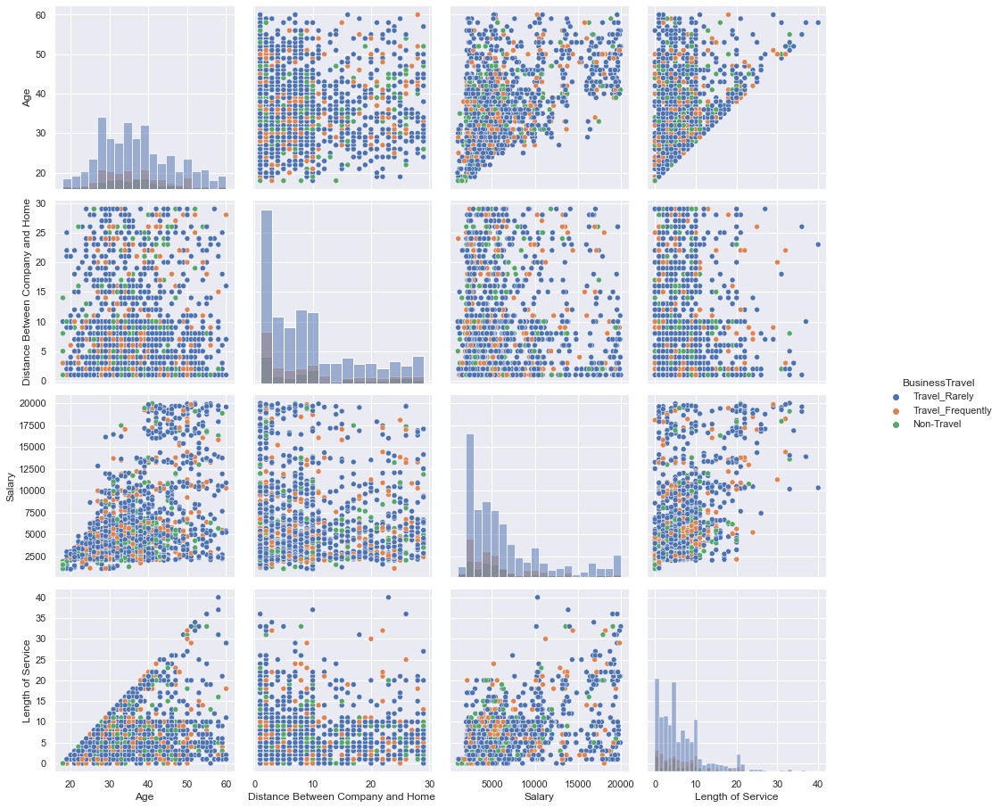

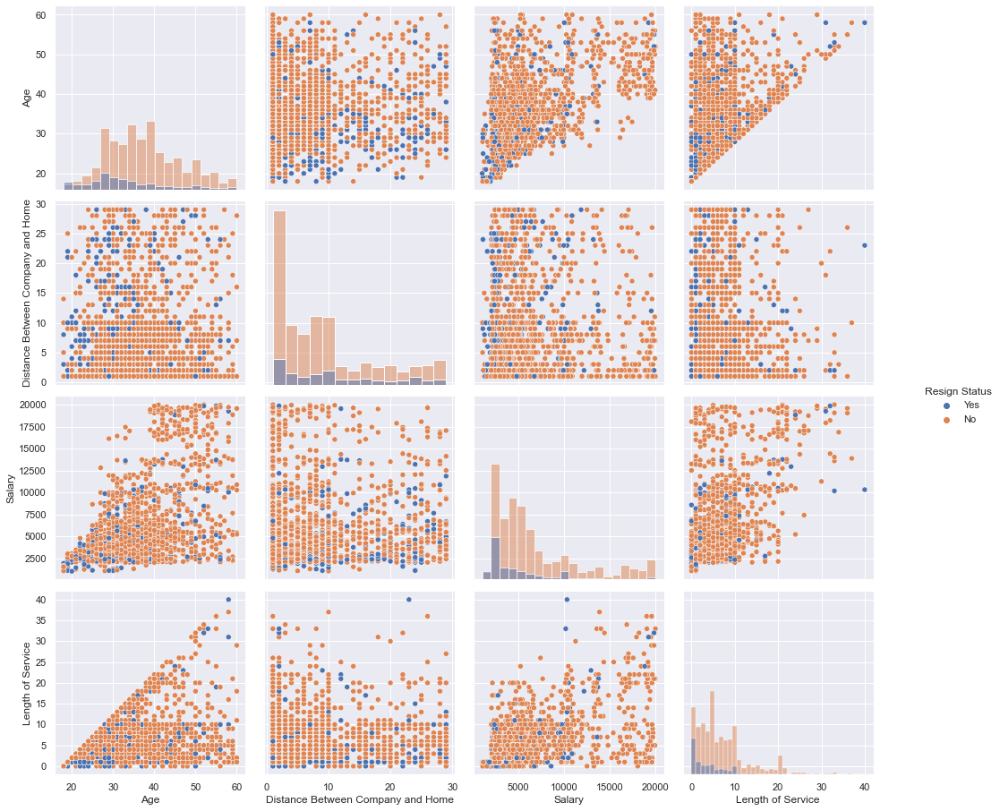

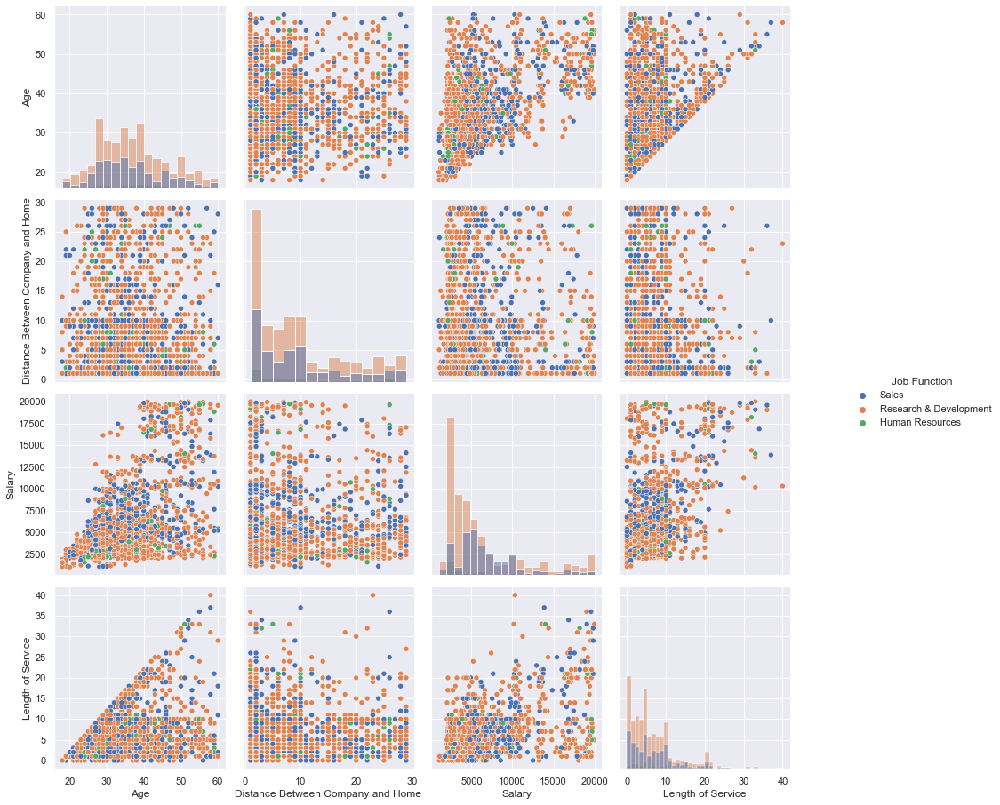

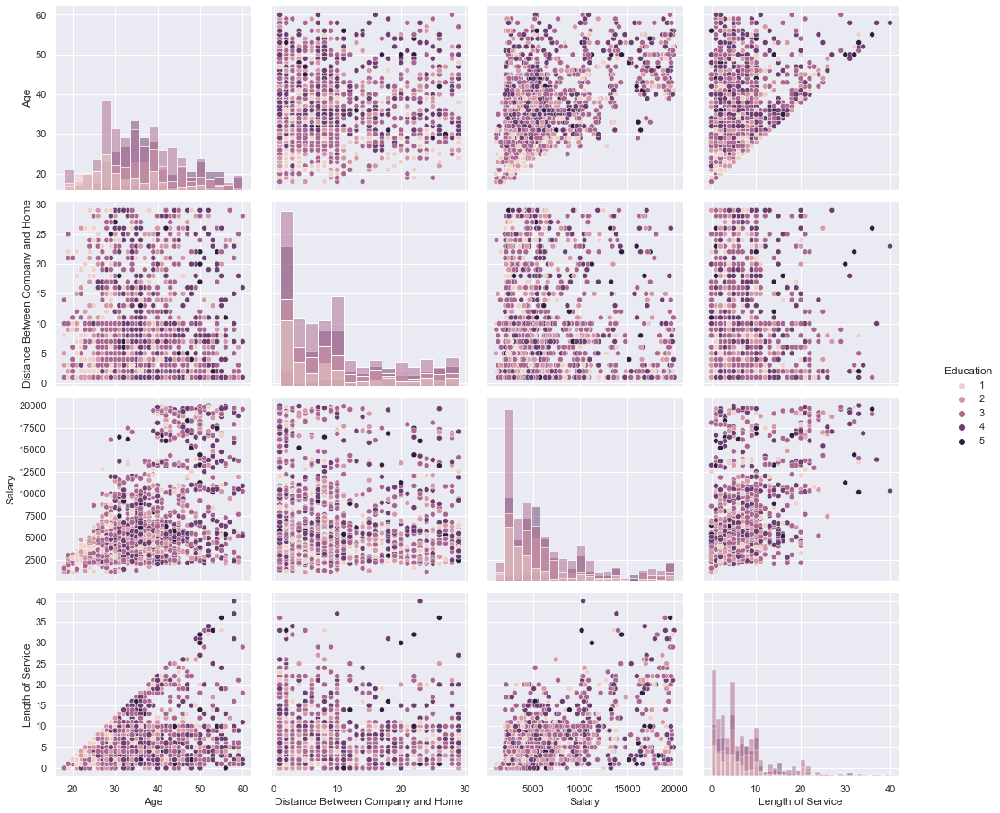

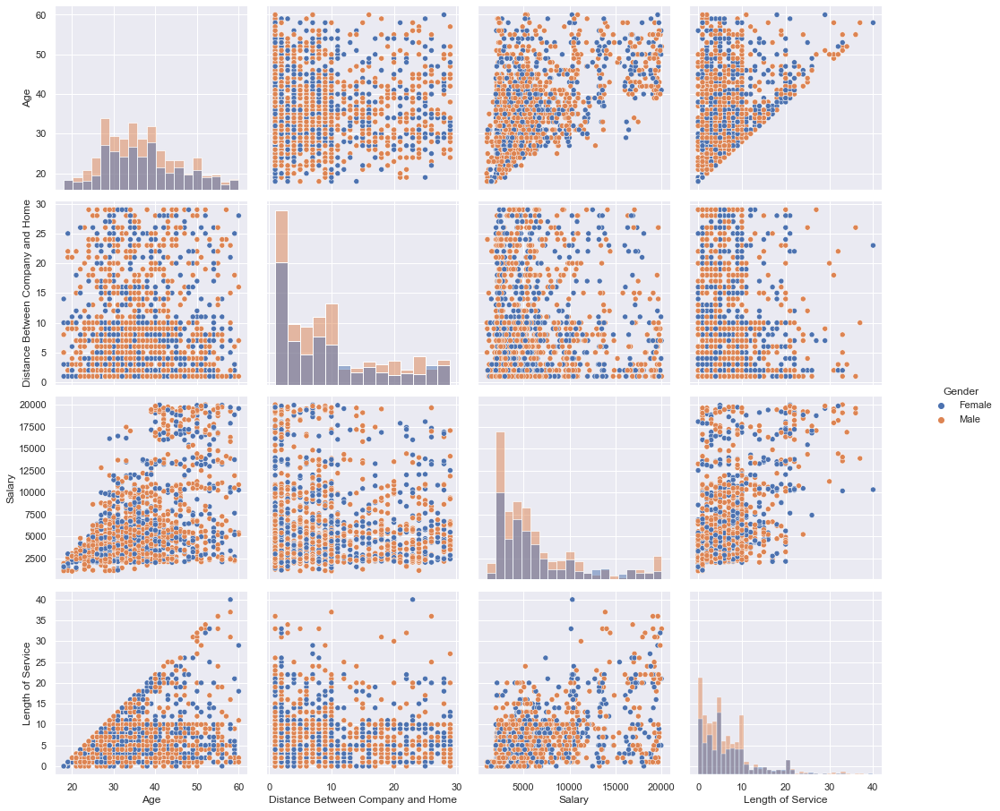

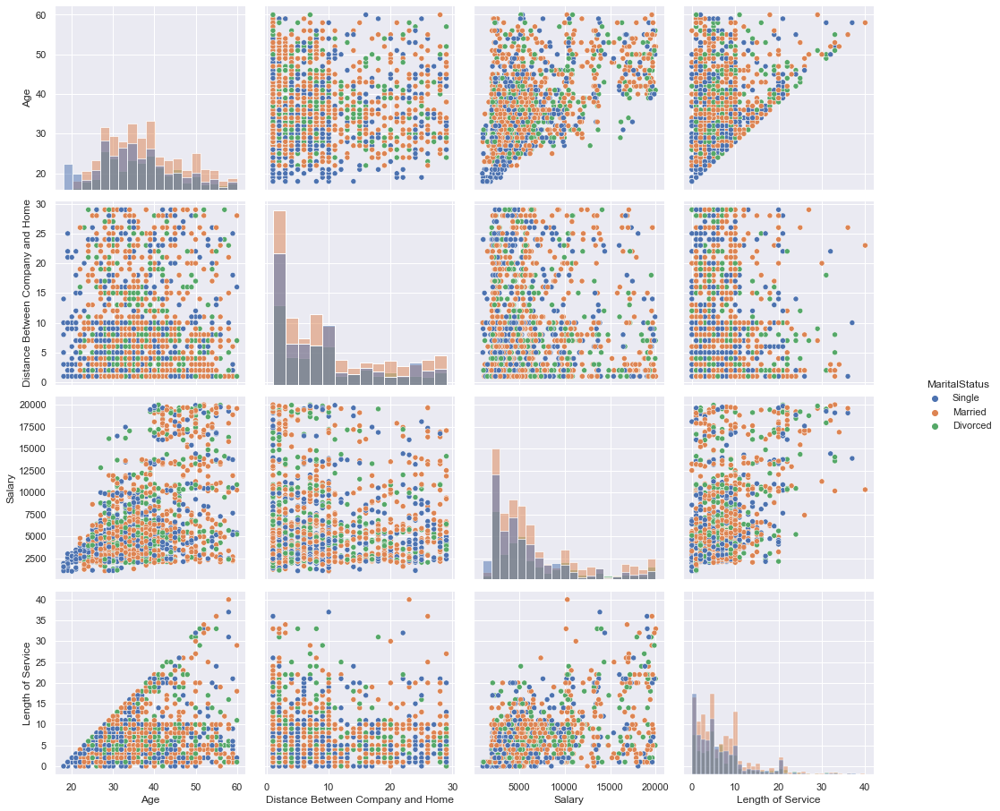

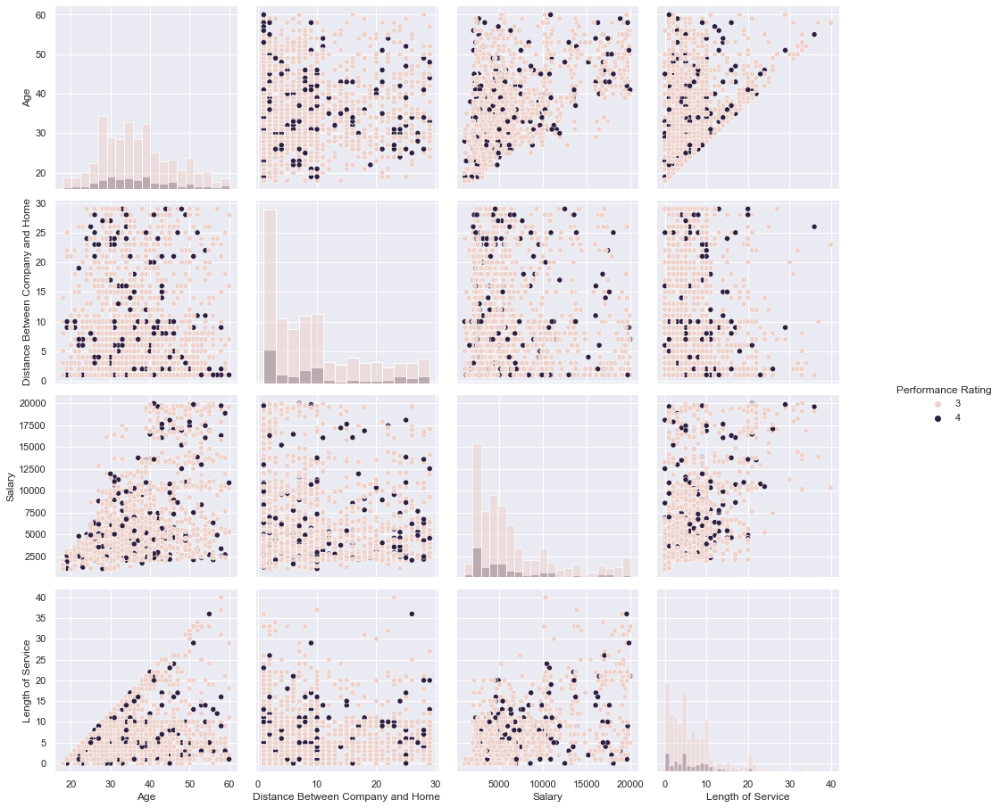

In [95]:
for cols in discretecols:
    sns.pairplot(data , x_vars = continuouscols , y_vars =continuouscols ,  diag_kind="hist"   , hue =   cols).figure.set_size_inches(16,13)
    plt.show() 

- There is no evident correlation between any of the variables here
- Possible for an older person to earn both a high or low salary but impossible for younger employee to earn a high salary
- Performance Rating, Maritial Status and gender does not appear to affect the salary of employee


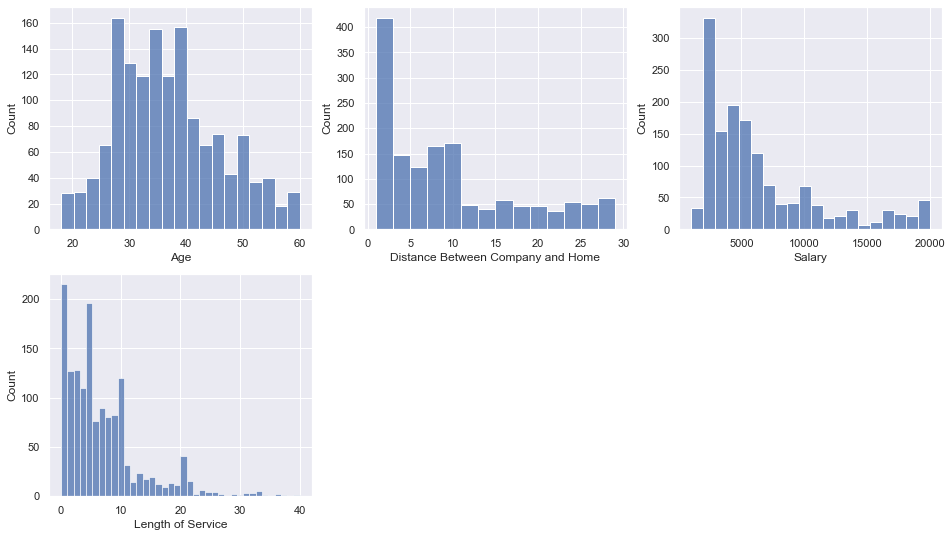

In [96]:
plt.figure(figsize = (16,9))
for i,continuous in enumerate(continuouscols):
    plt.subplot(ceil(len(continuouscols)/3) , 3 , 1+i)
    sns.histplot(x = data[continuous])
plt.show()

# Distribution of continouous features
feature | distribution
:-------------------|:---------------
Age | rougly Gaussian
distance | positively skewed
Salary | positively skewed
Length of service |positively skewed

> ### Choosing a Scaling method 
- Scaling is important for clustering as variable with different scales will distort the distances/similarity/dissimilarities calculated by the model 
- StandardScaler is not as suitable here as most of the data is non normally distributed 
- Min Max Scaler is used instead

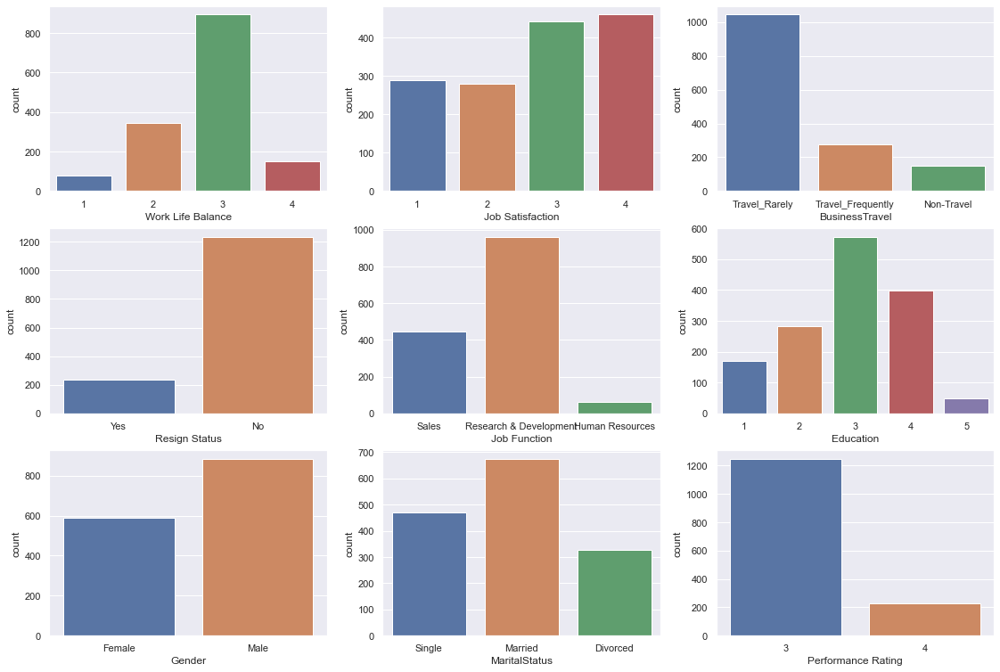

In [129]:
plt.figure(figsize = (19,13))
for i,discrete in enumerate(discretecols):
    plt.subplot(ceil(len(discretecols)/3) , 3 , 1+i)
    sns.countplot( data = data , x = discrete)
plt.show()

## count of categorical features

> Performance Rating 
- Most receive rating of 3 from the company, with some high performer receiving 4
- There only 2 values, and a majority of the company receive one value , might not be worth it to keep it

> Gender 
- More male employee than female employee in the company 

> Job statisfaction 
- About 500+ to 600 employee out of 1401 are not statisfied with the company (score of  1 and 2) , showing the need to perform this analysis to retain employees

> Resign Status 
- Most did not resign but 200 out of 1400 already resigned 
- This feature is espescially important to identify the group of employee that group of employee is the most vulnerable 

> Job Function 
- Most working in Research and Development (RND) 

> Education 
- Most have education level of 3, which is most likely a university degree, and less education level 1 and 5
- As Education 5 has good job opportunities 

> Work life balance 
- Most have right work life balance of 3 

> Business Travel 
- Most Travel Rarely as most of the company is RND 

> Marital Status
- Most are married
- About 300+ employees are divorced which is quite high  

interval columns not set, guessing: ['Age', 'Distance Between Company and Home', 'Education', 'Job Satisfaction', 'Salary', 'Performance Rating', 'Work Life Balance', 'Length of Service']


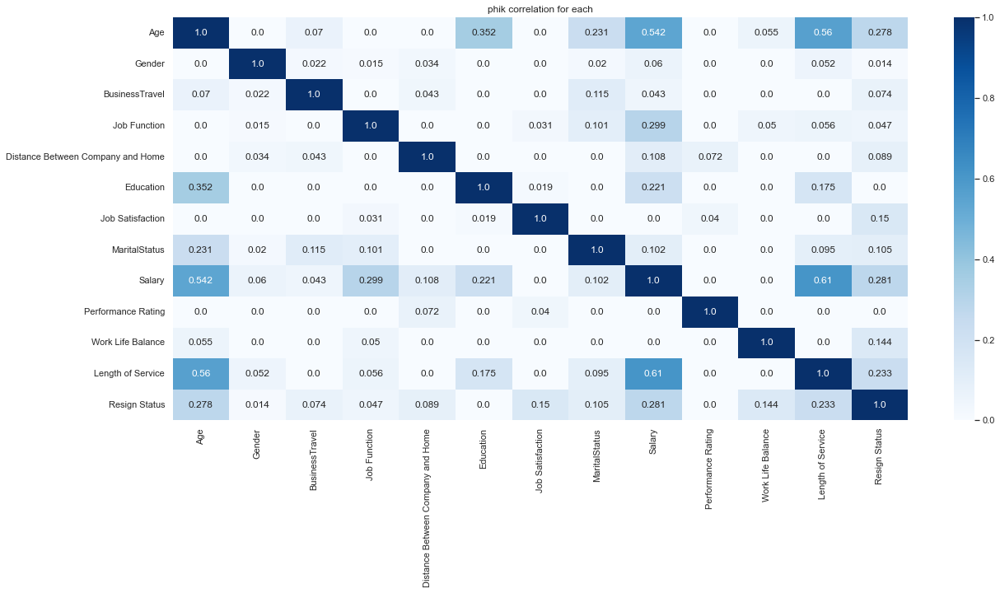

In [98]:
plt.figure( figsize = ( 20,9))
plt.title( 'phik correlation for each')
corr = data.phik_matrix()  
sns.heatmap(corr, fmt = ''  , cmap="Blues"  , annot = np.round(corr ,3))

plt.show()

### PHIK Correlations between features 
- Most features are not correlated and independant with each other 
- Between length of service and salary has the highest correlation of 0.61 which makes sense as more work expericence results in more salary
- Salary and Resign Status has correlation of 0.28 (I expected correlation to be higher) as people with lower salary are more likely to resign

### TSNE
- TSNE is a method that is able to reduce the dimension of the dataset 
- It is mainly used for visualisation 
- It tries to perserve the clusters in the higher dimensions (13) when reducing the dimensions down to 3 
- The output cannot be  used for clustering  models as clustering as results are not consistent for each run and the result highly dependant on hyperparameters such as perplexity 


Resign Status
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1470 samples in 0.006s...


C:\Users\yee88\Desktop\python\pyproj\Panda\mycondaenv3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\yee88\Desktop\python\pyproj\Panda\mycondaenv3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computed neighbors for 1470 samples in 0.081s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1470
[t-SNE] Computed conditional probabilities for sample 1470 / 1470
[t-SNE] Mean sigma: 1.328831
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.014618
[t-SNE] KL divergence after 300 iterations: 1.343292


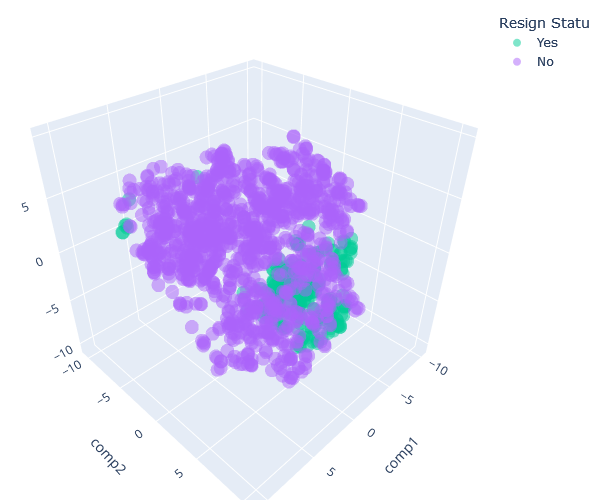

In [179]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler , OrdinalEncoder , LabelEncoder  , FunctionTransformer , OneHotEncoder
from sklearn.pipeline import make_pipeline
from sklearn.base import BaseEstimator,TransformerMixin
import plotly.express as px 
from sklearn.compose import ColumnTransformer
cols  = ['Gender' ,	'BusinessTravel' ,	'Job Function' , 'MaritalStatus' ] 

class CustomLabelEncoder(BaseEstimator,TransformerMixin):
    '''Label Encoding nominal data in  object f'''
    def __init__(self,  mappings  , column ):
        self.column = column
        self.mapping = mappings
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        X_ = X.copy()
        print(self.column)
        X_[self.column] = X_[self.column].map(self.mapping)
        return X_  
        

pipe = make_pipeline(CustomLabelEncoder({'Yes' : 1 , 'No' : 0}  , 'Resign Status'),
                     ColumnTransformer([('d' ,OrdinalEncoder() , cols   ) ] ,  remainder = 'passthrough')  ,
                     StandardScaler() , 
                     TSNE(n_components=3, verbose=1, perplexity=40, random_state= 228 ,  n_iter=300))

# onehotencoded = pd.concat((pd.get_dummies(data[nominal]) , data.drop(columns = nominal)) , axis = 1)
# onehotencoded['Resign Status'] = onehotencoded['Resign Status'].map(dict(Yes = 1 , No =0))
# tsnedata = TSNE(n_components=3, verbose=1, perplexity=2000, random_state= 228 ,  n_iter=300).fit_transform(onehotencoded )



tsnedata = pipe.fit_transform(data)
temp =  pd.concat((pd.DataFrame(tsnedata ).rename( columns ={0: "comp1" , 1 : 'comp2' , 2 : 'comp3'}), data ) , axis = 1)
px.scatter_3d(temp, x='comp1', y='comp2', z='comp3', opacity  = 0.5,
              color='Resign Status'   , width = 900 ,height= 500  , 
              color_discrete_map = {'0.0': 'yellow' , '1.0' :'blue'}).update_layout( margin=dict(l=20, r=10, t=10, b=0) ).show()



- There are 2 groups  shown when split by the resign status 
- From the tnse we can see some levels of high density and density based algorithms like optics might be worth a try 

# Distribution of continous variables accross the categorical variables


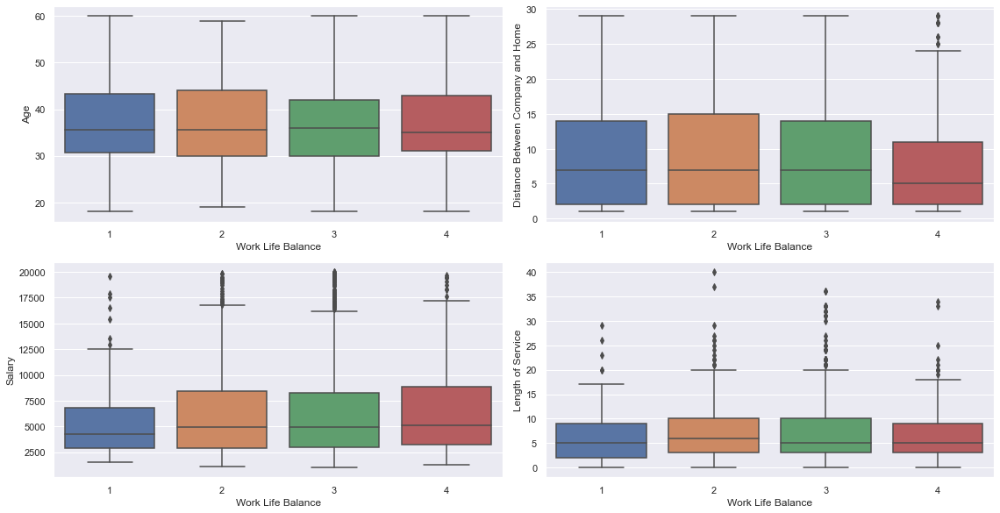

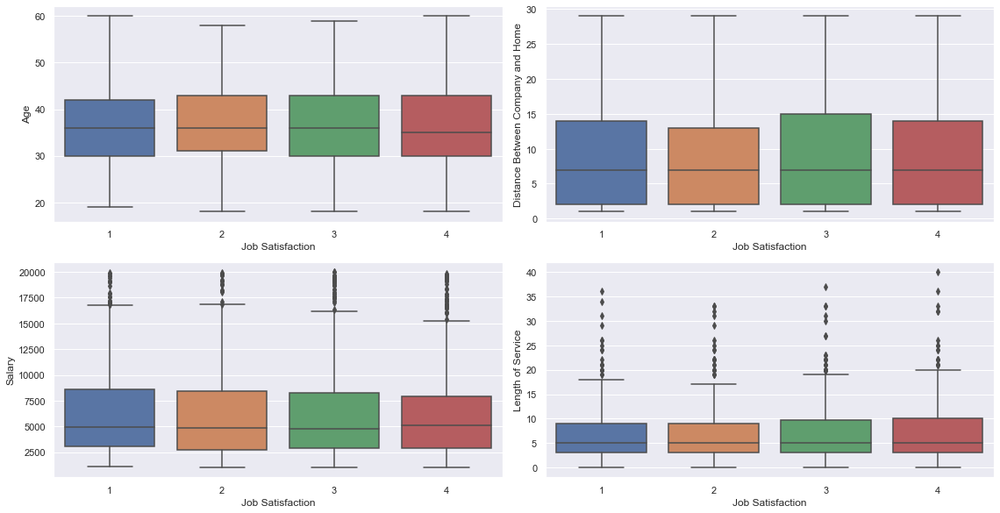

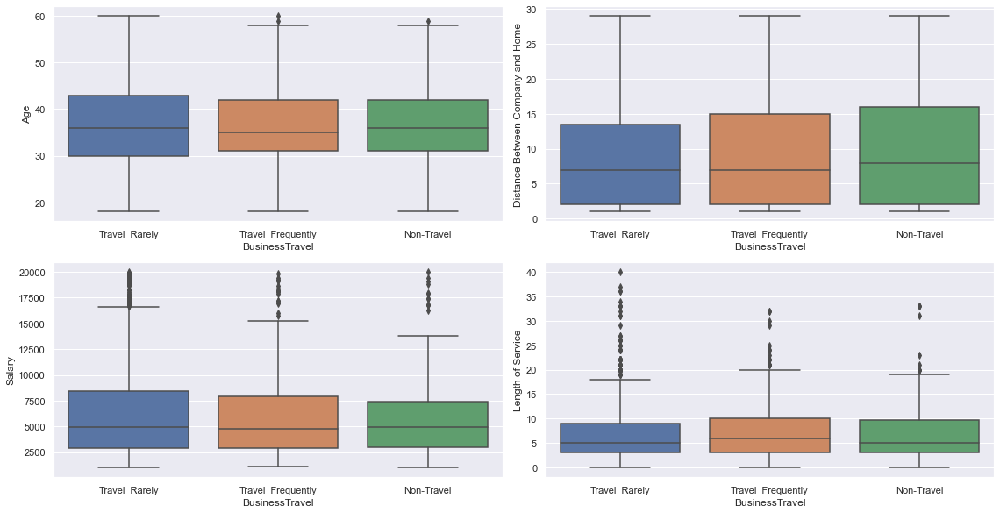

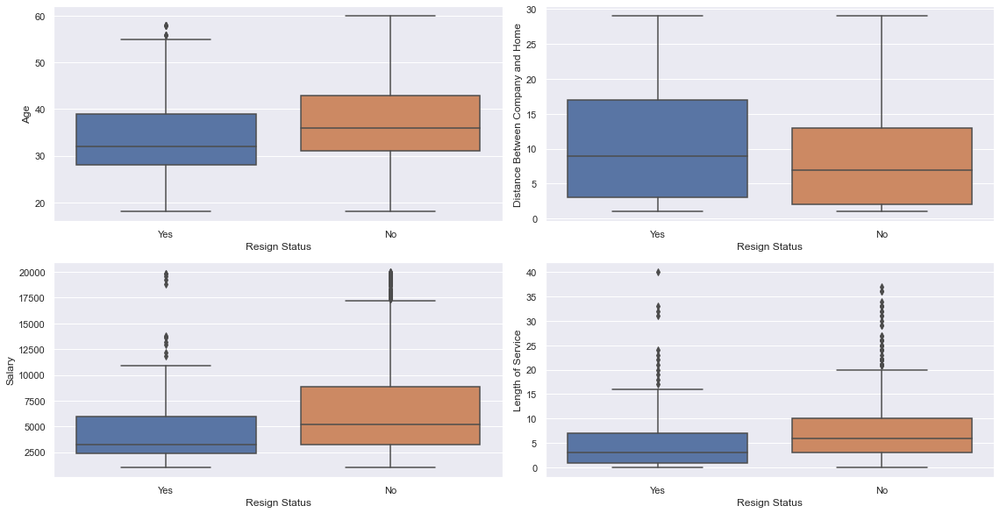

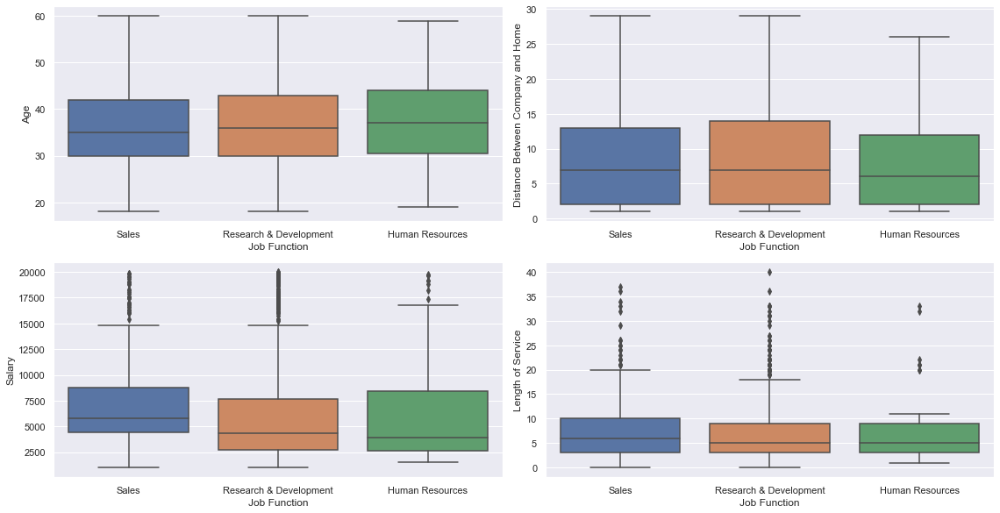

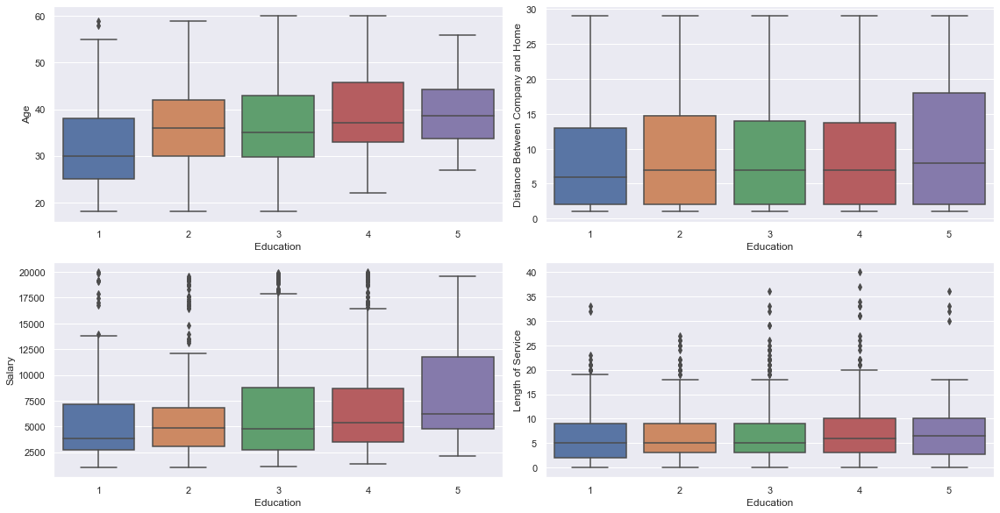

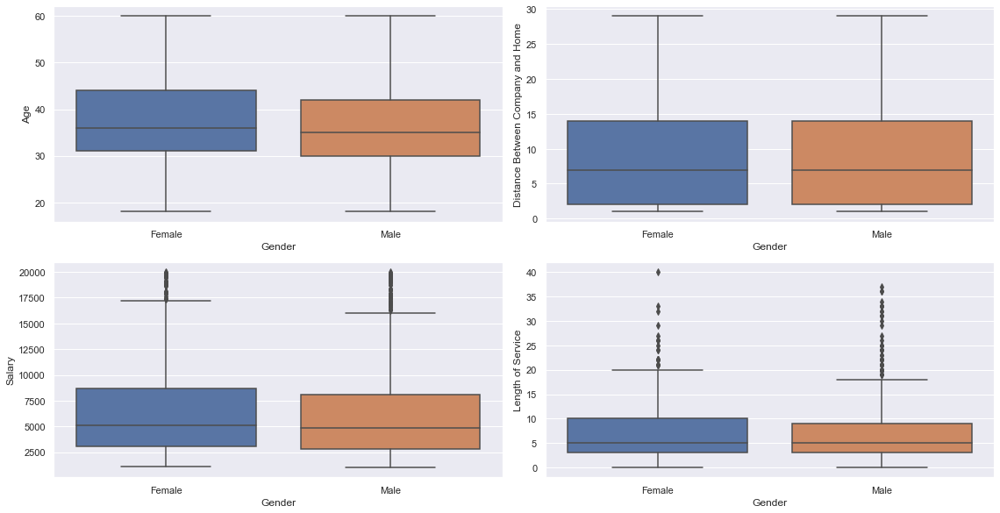

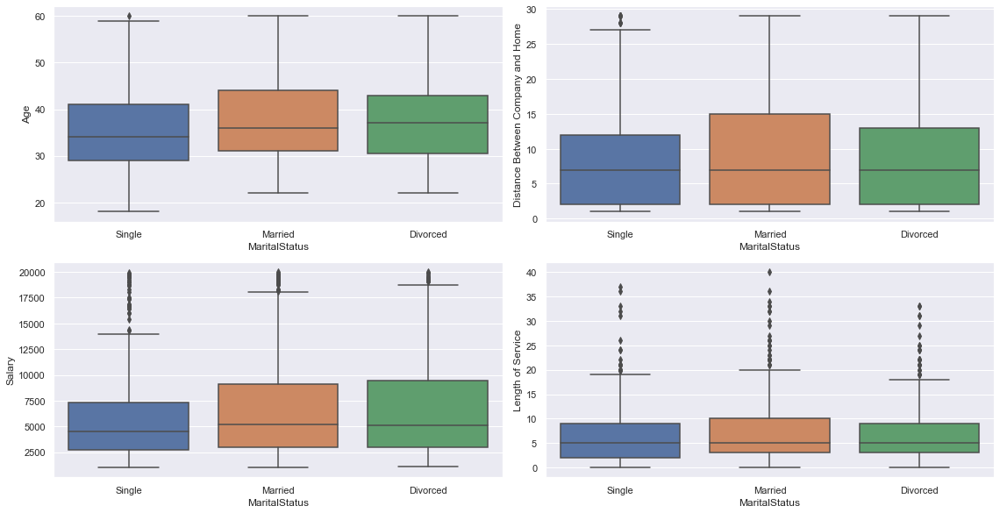

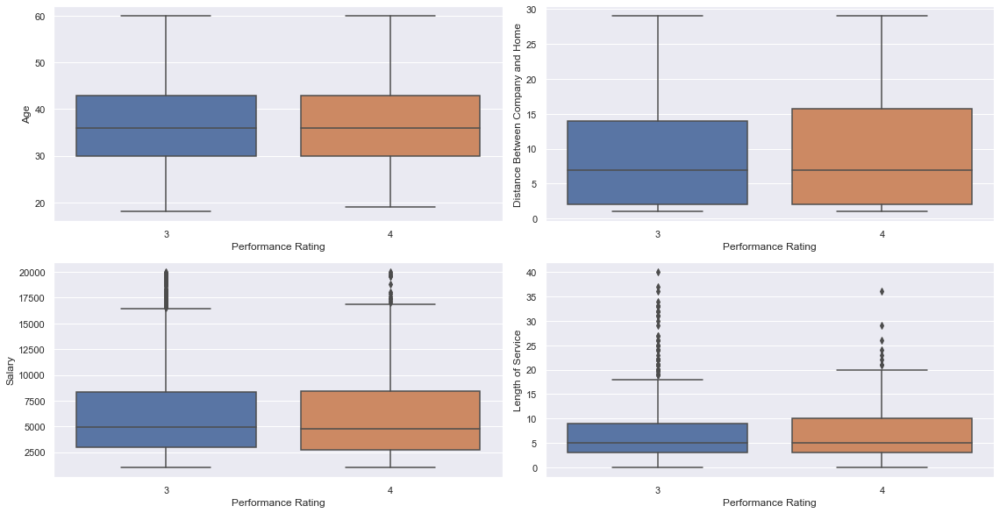

In [100]:
for discrete  in discretecols:
    plt.figure(figsize = (16,20))
    for i, continuous in enumerate(continuouscols):
        plt.subplot( ceil(len(discretecols)/2) ,2   , i+1)
        sns.boxplot(data = data, x = discrete , y = continuous)
    plt.tight_layout()
    plt.show()

- We want to investigate whether the distribution of continuous variables are different for each category of each categorical variable (ie whether males and females have different salaries or same salary)
- We note that the distribution (median , IQR) of salary age , length of service and distance  is similar for each category of the categorical variables Job Statisfaction , Performance Rating  , Gender and work life balance
- ie. the distribution of salary is similar for both male and female

- Hence, we need to perform further eda to determine whether these categorical variables are needed as they might make the clusters more ambiguous

In [101]:
from scipy.stats  import f_oneway  , levene 
def anova(data, categorical , continuous):
    test = list() 
    
    for unique in  data[categorical].unique():
        test.append(data.loc[data[categorical] == unique , continuous ])
    
    return f_oneway(*test)[1]


pvalues = []
vpvalues= []
for categorical in ['Job Satisfaction' ,  'Performance Rating' , 'Gender' , 'Work Life Balance']:
    pvaluerow = []
    for continuous in continuouscols:
        p_value = anova(data, categorical ,continuous )
        
        pvaluerow.append(round(p_value ,2  ) )
    pvalues.append(pvaluerow)
pvaluedf = pd.DataFrame( np.array(pvalues).T , index =continuouscols , columns = ['Job Satisfaction' ,  'Performance Rating' , 'Gender' , 'Work Life Balance'] )
significandf = pvaluedf.applymap(lambda x : x < 0.05 )
display(pvaluedf)
print('True means null hypothesis rejected, False means not rejected')

display(significandf)

,Job Satisfaction,Performance Rating,Gender,Work Life Balance
Age,0.98,0.94,0.16,0.87
Distance Between Company and Home,0.91,0.30,0.94,0.53
Salary,0.99,0.51,0.22,0.61
Length of Service,0.99,0.90,0.25,0.80


True means null hypothesis rejected, False means not rejected


,Job Satisfaction,Performance Rating,Gender,Work Life Balance
Age,False,False,False,False
Distance Between Company and Home,False,False,False,False
Salary,False,False,False,False
Length of Service,False,False,False,False


- From the anova test performed, the categorical features Job Statisfaction , Performance Rating  , Gender and work life balance has equal means for all the continous features. 
- These features will not be useful for clustering as different Job statisfaction level, performance ratings, Gender and Work life balance levels, all have similiar mean age, distance to company , salary and length of service which might make the clusters more ambiguous.

In [195]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler 
dataprocessed = data.copy() 
dataprocessed[continuouscols] = MinMaxScaler().fit_transform(dataprocessed[continuouscols])
col_remove = ['Job Satisfaction' , 'Performance Rating','Gender'  , 'Work Life Balance']
data2 = data.copy()
data2.drop(inplace = True, columns = col_remove )
dataprocessed.drop(inplace = True, columns = col_remove )

### Why not One Hot Encoding the nominal features 
- Normally in a machine learning task, nominal features are one hot encoded, however for the purposes of clustering the results may be less than ideal 
- One Hot Encoding results in a data matrix with a lot of ones and zeros which makes it difficult to calculate the Euclidean distance
- Hence, calculating a distance measurement that works for both categorical and numerical features (gower), and using that distance for clustering is probably more ideal


#### Gower Distance

- Clustering models require a meaure of similarity / difference in order to group the data points that are more similar to each other into the same clusters
- Other measures of similarity such as euclidean distance is not appropriate as the data contains a mix of categorical and numerical features and euclidean distance is most suitable for continuous numerical features
- Gower distance is a method to measure similarity/dissimilarity for both numerical and categorical features and  is the average of the partial features across the number of features used.
- Gower distance uses Manhattan distance between numerical features and dice distance for categorical features. 



In [104]:
dataprocessed.loc[:1]

,Age,BusinessTravel,Job Function,Distance Between Company and Home,Education,MaritalStatus,Salary,Length of Service,Resign Status
0,0.547619,Travel_Rarely,Sales,0.00,2,Single,0.262454,0.15,Yes
1,0.738095,Travel_Frequently,Research & Development,0.25,1,Married,0.217009,0.25,No


###### Sample Gower Distance Calculation
To calculate gower distance of top 2 rows:

feature | partial dissimilarity
:-------------------|:---------------
Age | abs(0.54-0.73)/ 1 = 0.19
Business travel | (different) 1
Job Function | (different) 1 
Distance between company and home | abs(0.00 - 0.25)/1 = 0.25
Education | (different) 1
Marital Status | (different) 1 
Salary | abs(0.262 - 0.217) /1 = 0.045
Length of Service | abs(0.15 - 0.25)/1 = 0.1
Resign Status | (different) 1 

Gower Dissimilarity = (0.19 + 1 + 1+ 0.25 + 1 + 1 + 0.045 + 0.1 + 1 ) / 9 features = 0.62

- The calculation of the gower distance is correct as verified by the entry in the first column and second row of the gower matrix which shows the gower distance between the first and second datapoint 


#### Limitations of Dice Distance
- dice distance does not deal with ordinal categorical features (such as education) as intended as the partial dissimilarity is 0 if education level is exactly the same and 1 if education level is different
- Partial dissimilarity between education level of 4 and 5 is 1 and partial similarity between education level of  1 and 5 is also 1, hence the ranking of different education level is disregarded
- Hence, ordinal features such as education should be treated as numerical features, so that the difference in ranking will be considered when calculating gower distances

In [196]:
dataprocessed['Education'] = MinMaxScaler().fit_transform(dataprocessed[['Education']])

In [207]:
from sklearn.cluster import DBSCAN , OPTICS 
from hdbscan import HDBSCAN
from gower import gower_matrix
from sklearn.metrics import silhouette_score ,  silhouette_samples
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import matplotlib as mpl
import matplotlib.cm as cm
from prince import FAMD
from plotly import tools
def silhouette_analysis_one(model , data    , cat_features , gower_matric = True  , use_gower_distance = True , model_kwarg = dict() , fit_kwarg = dict() ):
    gowerdistances = gower_matrix(data, cat_features =cat_features)

    if  use_gower_distance:
        try:

            clusterer = model(  metric = 'precomputed'  , **model_kwarg)
        except:
            clusterer = model(  affinity = 'precomputed' , **model_kwarg)
        cluster_labels = clusterer.fit_predict(gowerdistances.astype('float64')  , **fit_kwarg )
    else:
        clusterer = model(  **model_kwarg)
        cluster_labels = clusterer.fit_predict(data ,  **fit_kwarg )



    if gower_matric:
        silhouette_avg = silhouette_score(gowerdistances, cluster_labels,metric = 'precomputed')
    # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(gowerdistances, cluster_labels,metric = 'precomputed')
    else:
        silhouette_avg = silhouette_score(data, cluster_labels)
    # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(data, cluster_labels)
    n_clusters = len(np.unique( cluster_labels))
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )
    fig =   make_subplots(rows=1, cols=2,
                                  print_grid=False,
                                  subplot_titles=(f'The silhouette plot for the various clusters. {n_clusters} clusters',
                                                  'The visualization of the clustered data.') , specs = [[dict( type = 'xy' ) , dict(type = 'scene')]])

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]

        # Compute the silhouette scores for each sample
        


    
        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters

    y_lower = 10

    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        colors = 'rgb' + str(mpl.colors.colorConverter.to_rgb( cm.nipy_spectral(float(i) / n_clusters)))
        filled_area = go.Scatter(y=np.arange(y_lower, y_upper),
                                 x=ith_cluster_silhouette_values,
                                 mode='lines',
                                 showlegend=False,
                                 line=dict(width=0.5,
                                          color=colors),
                                 fill='tozerox')
        fig.append_trace(filled_area, 1, 1)
        y_lower = y_upper + 10 

        # Label the silhouette plots with their cluster numbers at the middle


    # The vertical line for average silhouette score of all the values
    axis_line = go.Scatter(x=[silhouette_avg],
                           y=[0, 10],
                           showlegend=False,
                           mode='lines',
                           line=dict(color="red", dash='dash',
                                     width =1) )

    fig.append_trace(axis_line, 1, 1)



    # 2nd Plot showing the actual clusters formed
    X = FAMD(n_components=3 ).fit_transform(data)
    
    X['clusters'] = cluster_labels
    clus_centers = X.groupby('clusters').mean().values
    X = X.iloc[ :, :3].values
    



    # colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    # print('colors' , colors)

    fig['layout']['xaxis1'].update(title='The silhouette coefficient values',
                           range=[-0.1, 1])

    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    fig['layout']['yaxis1'].update(title='Cluster label',
                                   showticklabels=False,
                                   range=[0, len(X) + (n_clusters + 1) * 10])

    colors = pd.Series(list(map(str , (list(map(   mpl.colors.colorConverter.to_rgb  , cm.nipy_spectral(cluster_labels.astype(float) / n_clusters) )) ))) )
    colors = 'rgb'+colors

    clusters = go.Scatter3d(x=X[:, 0], 
                          y=X[:, 1], 
                          z = X[:,2],
                          showlegend=False,
                          mode='markers',
                          opacity = 0.8, 
                          marker=dict(color=colors,size=4)
                         )
    
    fig.append_trace(clusters, 1, 2)    
    centers = go.Scatter3d(x=clus_centers[:, 0], 
                 y=clus_centers[:, 1],
                 z=clus_centers[:, 2],
                 showlegend=False,
                 mode='markers',
                 opacity = 0,
                 marker=dict(color='red', size=10,
                             line=dict(color='red',width=1))
                         
                    )
    fig.append_trace(centers, 1, 2)    

    fig.show()
        
    return cluster_labels


from kmodes.kprototypes import  KPrototypes
def silhouette_analysis(model , data  , unscaled   , range_n_clusters  , cat_features , gower_matric = True  , use_gower_distance = True , model_kwarg = dict() , fit_kwarg = dict() ):
    gowerdistances = gower_matrix(data, cat_features =cat_features)  
    cluslabels =dict()
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
     
        
        if  use_gower_distance:
            try:
                
                clusterer = model(n_clusters=n_clusters ,  metric = 'precomputed'  , **model_kwarg)
            except:
                clusterer = model(n_clusters=n_clusters,  affinity = 'precomputed' , **model_kwarg)
            cluster_labels = clusterer.fit_predict(gowerdistances  , **fit_kwarg )
        else:
            clusterer = model(n_clusters=n_clusters, **model_kwarg)
        
            clusterer.fit( data ,  **fit_kwarg)
            cluster_labels = clusterer.predict(data ,  **fit_kwarg )
        cluslabels[n_clusters] = cluster_labels
        
        
        if gower_matric:
            silhouette_avg = silhouette_score(gowerdistances, cluster_labels,metric = 'precomputed')
        # Compute the silhouette scores for each sample
            sample_silhouette_values = silhouette_samples(gowerdistances, cluster_labels,metric = 'precomputed')
        else:
            silhouette_avg = silhouette_score(data, cluster_labels)
        # Compute the silhouette scores for each sample
            sample_silhouette_values = silhouette_samples(data, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )
        fig = make_subplots(rows=1, cols=2,
                              print_grid=False,
                              subplot_titles=(f'The silhouette plot for the various clusters. {n_clusters}  clusters',
                                              'The visualization of the clustered data.') ,  specs = [[dict( type = 'scatter' ) , dict(type = 'scatter3d')]] )

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]

        # Compute the silhouette scores for each sample
        


    
        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
      
        y_lower = 10

        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            colors = 'rgb' + str(mpl.colors.colorConverter.to_rgb( cm.nipy_spectral(float(i) / n_clusters)))
            filled_area = go.Scatter(y=np.arange(y_lower, y_upper),
                                     x=ith_cluster_silhouette_values,
                                     mode='lines',
                                     showlegend=False,
                                     line=dict(width=0.5,
                                              color=colors),
                                     fill='tozerox')
            fig.append_trace(filled_area, 1, 1)
            y_lower = y_upper + 10 

            # Label the silhouette plots with their cluster numbers at the middle
 

        # The vertical line for average silhouette score of all the values
   
        


        # 2nd Plot showing the actual clusters formed
        X = FAMD(n_components=3 ).fit_transform(unscaled)#.rename(columns = {0 : 'first'  , 1 : 'second'})

        X['clusters'] = cluster_labels
        clus_centers = X.groupby('clusters').mean().values
        X = X.iloc[ :, :3].values
    
   
        fig['layout']['xaxis1'].update(title='The silhouette coefficient values',
                               range=[-0.2, 1])

        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        fig['layout']['yaxis1'].update(title='Cluster label',
                                       showticklabels=False,
                                       range=[0, len(X) + (n_clusters + 1) * 10])
        
        colors = pd.Series(list(map(str , (list(map(   mpl.colors.colorConverter.to_rgb  , cm.nipy_spectral(cluster_labels.astype(float) / n_clusters) )) ))) )
        colors = 'rgb'+colors
        
        clusters = go.Scatter3d(x=X[:, 0], 
                              y=X[:, 1], 
                              z = X[:,2],
                              showlegend=False,
                              opacity = 0.2, 
                              mode='markers',
                              marker=dict(color=colors,
                                         size=4)
                             )
        fig.append_trace(clusters, 1, 2)      
        
        centers = go.Scatter3d(x=clus_centers[:, 0], 
             y=clus_centers[:, 1],
             z=clus_centers[:, 2],
             showlegend=False,
             mode='markers',
             opacity = 1,
             marker=dict(color='red', size=10,
                         line=dict(color='red',
                                                 width=1))
                         
                    )
        fig.append_trace(centers, 1, 2) 
 

        axis_line = go.Scatter(x=[silhouette_avg , silhouette_avg],
                           y= [0 , 100000],
                           showlegend=False,
                           mode='lines',
                           line=dict(color="red", dash='dash',
                                     width =1) )
        fig.append_trace(clusters, 1, 2)    
        fig.append_trace(axis_line  , 1, 1)

        fig.show()
        
    return cluslabels

def get_cluster_info(df, lbls , categoricalcols):
    eval_df = df.copy(deep=True)
    eval_df['Clusters'] = lbls
    cluster_info= eval_df.groupby('Clusters').agg(
            {
                'Age':'mean',
                'Resign Status': lambda x: x.value_counts(sort=True).index[0],
                'MaritalStatus': lambda x: x.value_counts(sort=True).index[0],
                'Education': lambda x: x.value_counts(sort=True).index[0],
                'Job Function': lambda x: x.value_counts(sort=True).index[0],
                'Distance Between Company and Home': 'mean',
                'Length of Service': 'mean',
                'Salary': 'mean',
            }
        ).reset_index()
    cluster_info['Cluster Size (% of Total)'] = pd.Series(eval_df['Clusters']).value_counts() / len(eval_df['Clusters']) * 100
    cluster_info.set_index('Clusters', inplace=True)
    display(cluster_info)
    sns.pairplot(eval_df[continuouscols + ['Clusters']], hue='Clusters', corner=True, palette="tab10")
    plt.show()
    return eval_df
from kmodes.kprototypes import KPrototypes


### Optics

For n_clusters = 59 The average silhouette_score is : -0.2523425


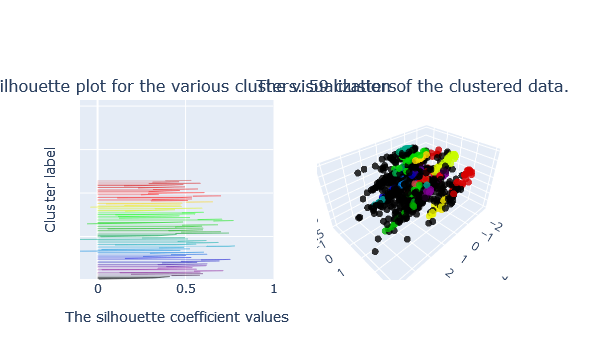

In [107]:
opticlabels =silhouette_analysis_one(OPTICS , dataprocessed  , [col in  gowercatcols  for col in dataprocessed.columns ]   ,
                    use_gower_distance = True , gower_matric =True   , model_kwarg = dict(n_jobs = -1 )  )

- Optics finds samples of high density and attempts to find clusters from there, is able to auto matically find the number of clusters
- The average silluolette score is -0.25 , showing that datapoints are generally closer to data points in other clusters compared to datapoints in its own cluster, which is poor clustering
- It has automatically found 59 clusters which is not useful for our purposes as it is very difficult to extract insights from so many clusters

# Aggloromative Clustering
- Is a 'buttom up' hierarchy clustering approach that treats each indidual datapoint as its own cluster and then continually groups the data points together until the dataset in one cluster

> ### How it works
1. Each datapoint is its own cluster at the start
2. Based on the gower distance passed into the model, the datapoints that are most similiar to each other are grouped together to form clusters
3. These  that are most similar to each other form larger clusters 
4. Step 4 repeats until all data points are in one big cluster

> ### Why it is useful
- It generates a dendogram which shows how the clusters are formed in the iterative process above.


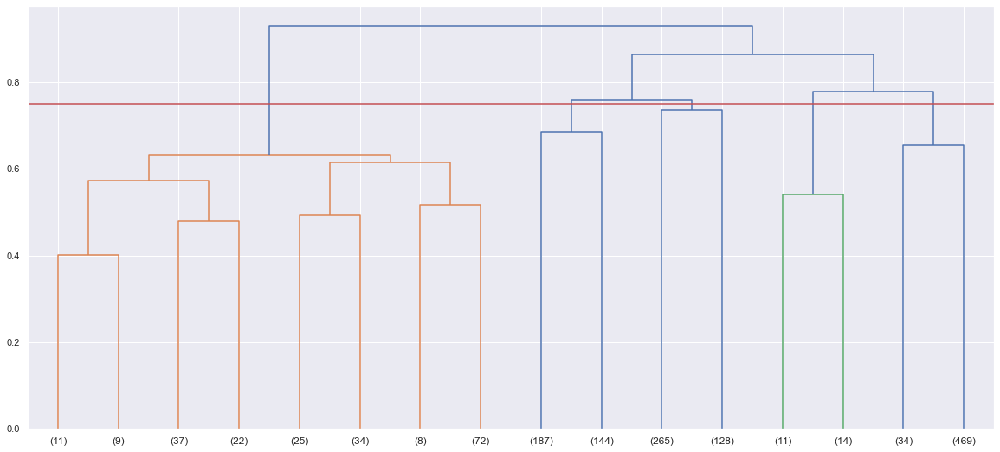

In [170]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
agglomerativemodel = AgglomerativeClustering(distance_threshold=0, n_clusters=None , linkage = 'complete', affinity = 'precomputed' )
agglomerativemodel.fit(gower_matrix(dataprocessed , cat_features = [col in gowercatcols for col in dataprocessed.columns]))
plt.figure(figsize = (20,9))
plot_dendrogram(agglomerativemodel  , truncate_mode="level" , p= 3 )
plt.axhline(0.75 , color = 'r')
plt.show()

According to dendogram produced by Agglomerative Clustering:
- If the number of clusters is small (< 6), the maximum distance (0.7) between the data points in each cluster is very large  (data points that are very different end up in the same cluster), leading to not as ideal clustering as data points in cluster is not cohesive
- If the number of cluster is big, the datapoints in each cluster are more similar/cohesive but increases the complexity of finding the characteristics of each cluster
- I ultimately choose 0.75 ( which is 5 clusters as 5 vertical lines intersect with the horizontal line) as the distance threshold as I do not want too many clusters which will complicate the process of finding the characteristics of each cluster

For n_clusters = 5 The average silhouette_score is : 0.15329203


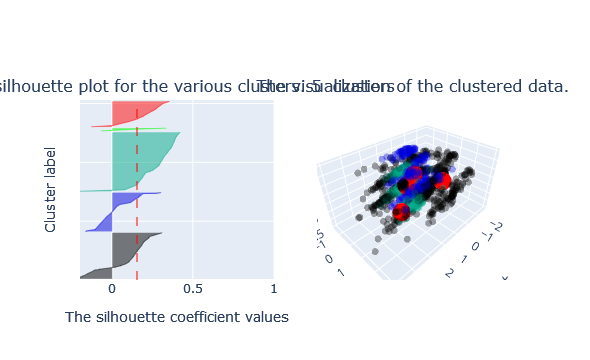

In [174]:
agglomerativelabels = silhouette_analysis(AgglomerativeClustering ,  dataprocessed , 
                    dataprocessed ,
                   [5], [col in gowercatcols  for col in dataprocessed.columns ],
                    use_gower_distance = True  , gower_matric =True  , model_kwarg = dict(linkage = 'complete')  )    

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance Between Company and Home,Length of Service,Salary,Cluster Size (% of Total)
Clusters,,,,,,,,,
0,39.284987,No,Single,3,Research & Development,7.404580,9.142494,9230.119593,26.734694
1,36.836858,No,Divorced,3,Research & Development,8.912387,6.990937,6192.577039,22.517007
2,36.437376,No,Married,3,Research & Development,9.773360,6.047714,5152.992048,34.217687
3,50.560000,Yes,Married,4,Research & Development,15.000000,17.560000,14330.000000,1.700680
4,32.357798,Yes,Single,3,Research & Development,10.834862,4.192661,4274.880734,14.829932


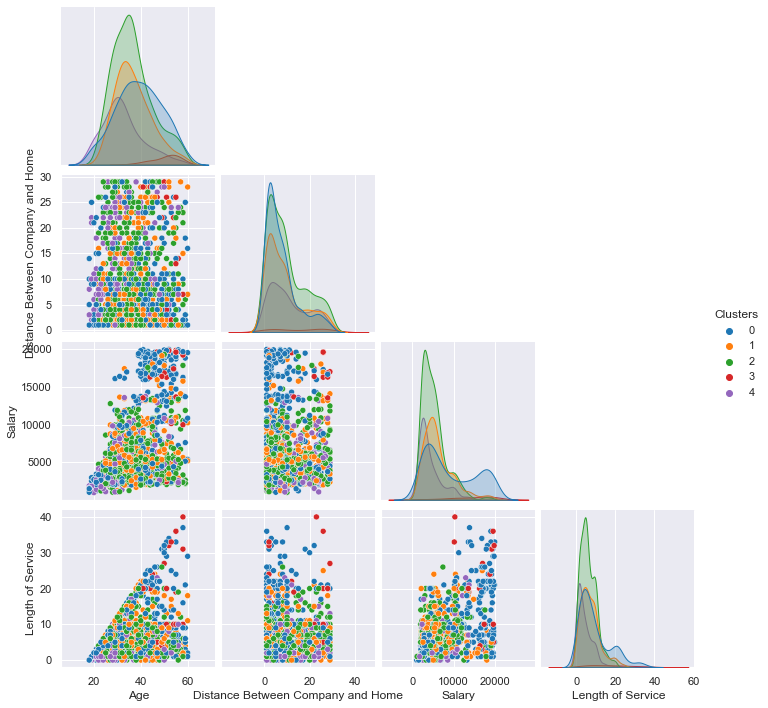

In [180]:
get_cluster_info(data, agglomerativelabels[5] , gowercatcols);

- Aggloromative clustering forms clusters with significantly different sizes. Some clusters have very little datapoints, show by the thin strips in the silhouette plot, which might hinder analysis (for extracting the characteristics of each cluster / each type of employee)
- Cluster 3 is just 1.7% of all the employees, which makes finding the insight of each cluster hard 
- the pairplot looks random as there is no distinct cluster in it.

### KPrototypes
- KPrototypes can take in mixed type (numerical  and categorical data) directly without needing the gower matrix
- Combination of KMeans ( numerical features ) and KModes (categorical features)
- Uses  Euclidean distance for numerical features 
- Uses matching similarity for categorical features (if same means 0, if different means 1 )
- specify which features are categorical via the `categorical` argument


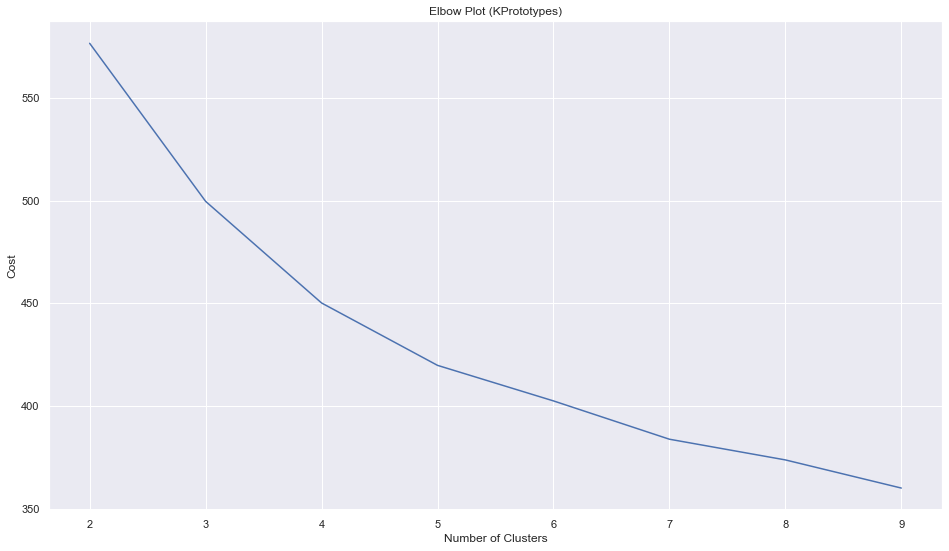

In [156]:
costs = []
n_clusters = []
for i in range(2, 10):
    kproto = KPrototypes(n_clusters=i, init='Cao',random_state=38, n_jobs = -1)
    kproto.fit_predict(dataprocessed, categorical=list(map(dataprocessed.columns.get_loc , list(set(gowercatcols) & set(dataprocessed.columns)) )) )
    costs.append(kproto.cost_)
    n_clusters.append(i)
plt.figure(figsize = (16,9))
plt.plot( n_clusters, costs )
plt.title("Elbow Plot (KPrototypes)")
plt.xlabel('Number of Clusters')
plt.ylabel('Cost')
plt.show() 


- 4, 5, or 6 Clusters looks to be the most promising as the decrease in cost of 50 from  3 clusters to 4 clusters is still significant but the decrease in cost of around 15 (estimated) from 6 clusters to 7 clusters is no longer significant
- To Perform silhouette analysis on whether to choose which number of clusters (4,5 or 6)

For n_clusters = 4 The average silhouette_score is : 0.09917476


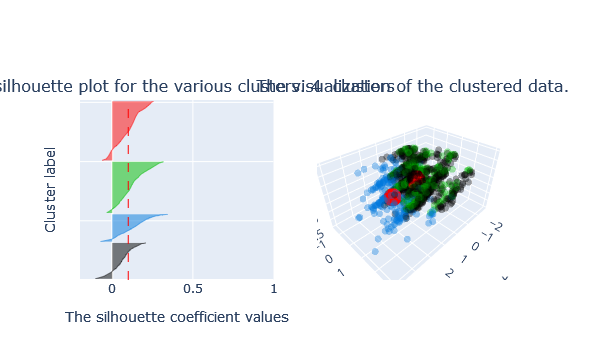

For n_clusters = 5 The average silhouette_score is : 0.09619732


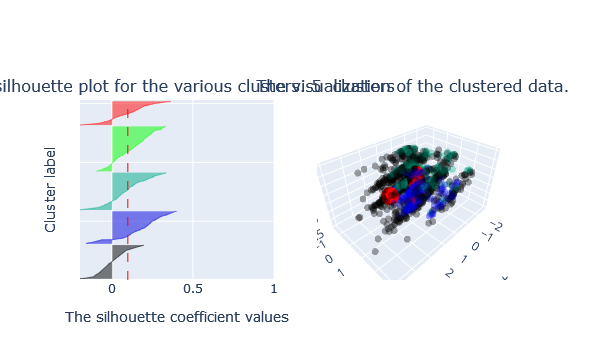

For n_clusters = 6 The average silhouette_score is : 0.095641196


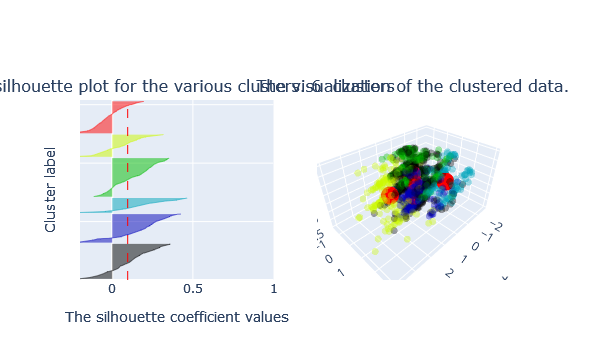

In [224]:
initialkprototypeslabels = silhouette_analysis(KPrototypes ,  dataprocessed , 
                    data2 ,
                   [4,5,6],      [col in gowercatcols  for col in dataprocessed.columns ],
                    use_gower_distance = False , gower_matric =True   , model_kwarg = dict( n_jobs = -1 ,  random_state = 38 , max_iter = 1000) ,
                    fit_kwarg = dict(categorical =list(map(dataprocessed.columns.get_loc , list(set(gowercatcols) & set(dataprocessed.columns)) )) ) )    

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance Between Company and Home,Length of Service,Salary,Cluster Size (% of Total)
Clusters,,,,,,,,,
0,36.503289,No,Married,3,Research & Development,22.233553,6.368421,5569.904605,20.680272
1,47.051724,No,Married,3,Research & Development,6.711207,13.831897,15166.715517,15.782313
2,33.115207,No,Married,2,Research & Development,5.359447,5.361751,4446.981567,29.523810
3,35.786000,No,Single,4,Research & Development,5.742000,5.660000,4834.780000,34.013605


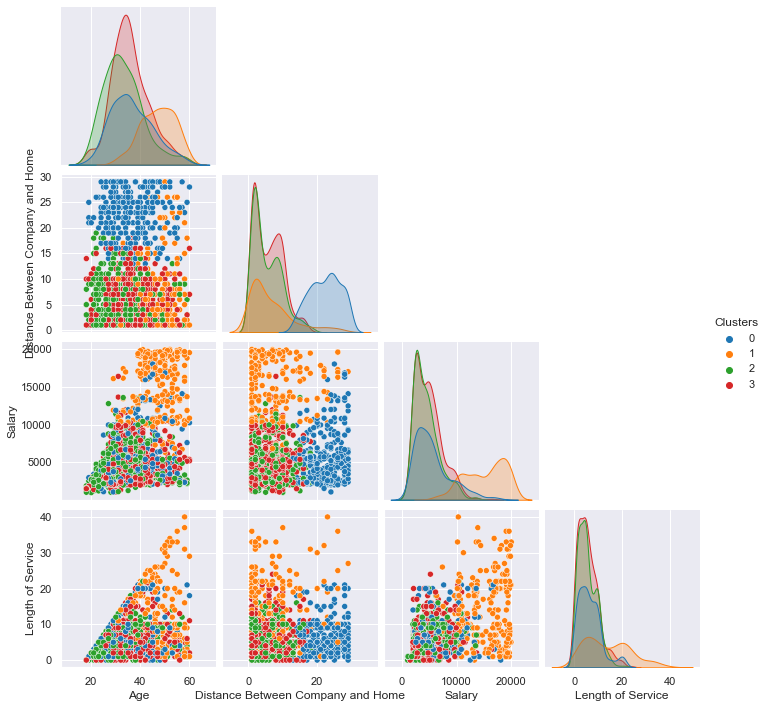

In [221]:
get_cluster_info(data, initialkprototypeslabels[4] , gowercatcols);

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance Between Company and Home,Length of Service,Salary,Cluster Size (% of Total)
Clusters,,,,,,,,,
0,36.656250,No,Married,3,Research & Development,22.534722,6.440972,5598.461806,19.591837
1,39.534296,No,Married,3,Sales,6.509025,6.671480,6204.328520,18.843537
2,31.094044,No,Married,2,Research & Development,5.479624,4.990596,4000.721003,21.700680
3,34.631854,No,Single,4,Research & Development,5.357702,5.378590,4468.798956,26.054422
4,47.226601,No,Married,3,Research & Development,6.995074,14.517241,15963.413793,13.809524


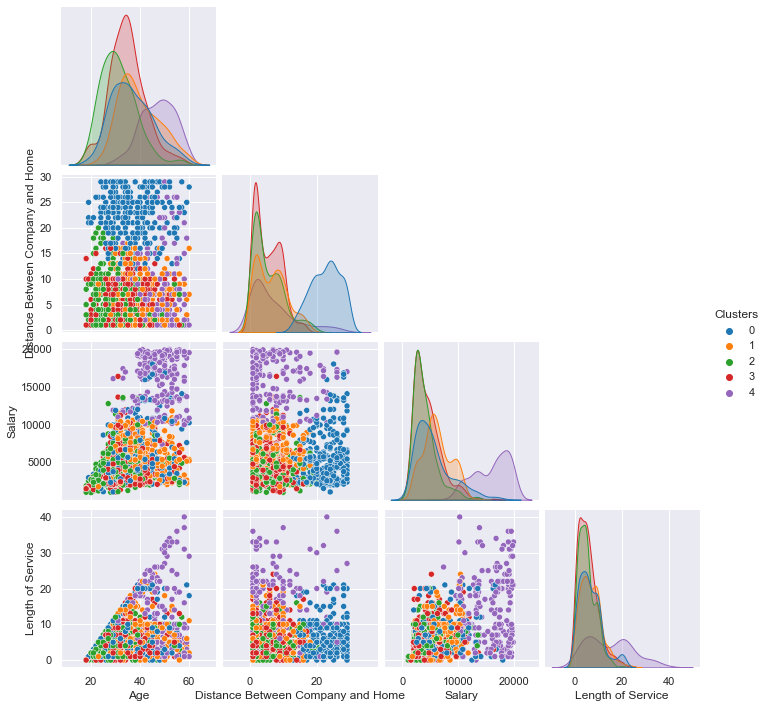

In [222]:
get_cluster_info(data, initialkprototypeslabels[5] , gowercatcols);

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance Between Company and Home,Length of Service,Salary,Cluster Size (% of Total)
Clusters,,,,,,,,,
0,32.183333,No,Married,2,Research & Development,5.386667,5.373333,4225.966667,20.408163
1,40.102041,No,Married,3,Sales,6.391837,6.714286,6240.591837,16.666667
2,27.757812,Yes,Single,3,Sales,10.156250,3.492188,3764.101562,8.707483
3,35.631420,No,Single,4,Research & Development,4.984894,5.679758,4582.764350,22.517007
4,47.031414,No,Married,3,Research & Development,5.979058,14.596859,16027.937173,12.993197
5,38.065455,No,Married,3,Research & Development,22.687273,7.018182,6191.047273,18.707483


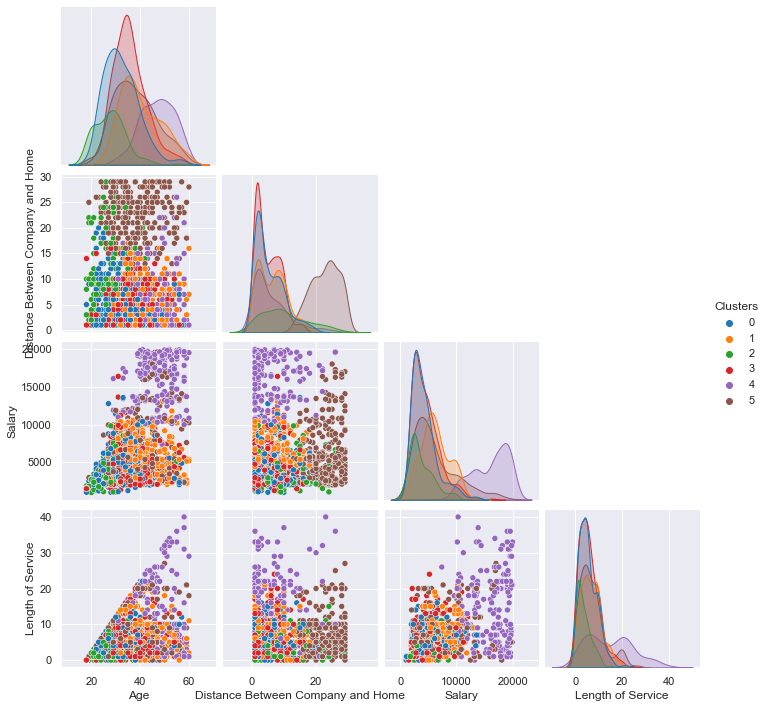

In [223]:
get_cluster_info(data, initialkprototypeslabels[6] , gowercatcols);

- All silluolette scores are similar at around 0.09, Hence, we will be using the scatterplot and  descriptive statistics


> K = 4
> - The 3 cluster centroids appear too close to each other as cluster controids should be more spread apart
> - Unable to find out why employees are resigning

> K = 5 
> - Also unable to find out why employees are resigning 
> - 4 Cluster centroids also appear too close to each other as they line up in a line 
 


> K = 6
> - Cluster Centroids looks like they are more evenly spread out accross the space of the scatterplot 
> - n_clusters = 6 has cluster 2 as yes to show the majority of cluster 2 has resigned and hence some measures can be identified for them


> - n_clusters = 4 and n_clusters = 5 shows that it is difficult to identify which cluster is most prone to resigning as none of the clusters have a mode of 'yes' for resign status ie. majority of each cluster do not resign. Hence, it is hard to tell the difference between those who resign and those who didnt
> - Hence, n_clusters = 6 is chosen

# Model Improvement / Feature Selection for KPrototypes
- To improve on the quality of the clusters ( as the silluolette score above is not very high) , I decided to implement feature selection for K prototypes, althought 4 features was dropped based on the results of ANOVA test, there might still be some undetected features
- Each combination of features and number of clusters is clustered using the KPrototypes, and the KPrototypes `.cost_` metric is kept
- The results is graphed onto an elbow plot
- The combinations with the lowest value of `.cost_` is further analysed.

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   31.7s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:   35.8s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   38.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   38.7s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   39.7s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:   40.4s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   41.5s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:   42.4s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   42.5s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   44.1s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   44.5s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

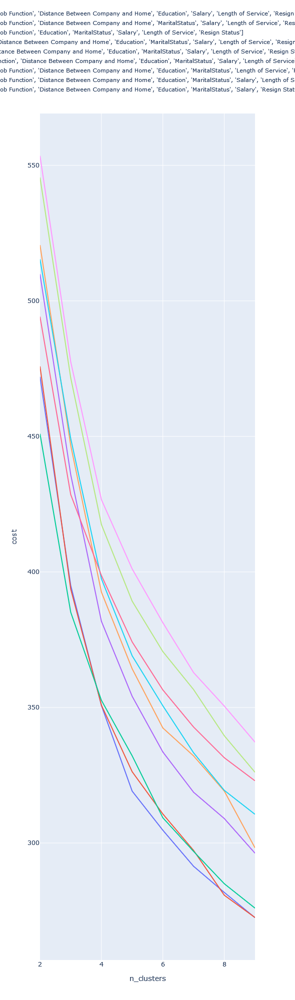

In [26]:
from sklearn.base import clone 
from gower import gower_matrix
from joblib import Parallel , delayed
import itertools
from functools import partial
def fit_with_score(subset  , model  , n_clusters, cat_features , metric , model_kwargs = dict()  , fit_kwargs = dict()):
    try:
       # print([col in  cat_features  for col in subset.columns ])
        gowerdistances = gower_matrix(subset, cat_features =[col in  cat_features  for col in subset.columns ])  
     #   print('after gower')
        fit_kwargs = dict(categorical =list(map(subset.columns.get_loc , list(set(cat_features)  & set(subset.columns)) )) )
        m = model(n_clusters = n_clusters   , **model_kwargs)
        labels = m.fit_predict(subset , **fit_kwargs)
        if metric == 'silhouette':
            
            silhouette_avg = silhouette_score(gowerdistances, labels,metric = 'precomputed')
            return {'silhouette' : silhouette_avg  , 'subset' : list(subset.columns ), 'n_clusters' : n_clusters }
        elif metric == 'cost':
            cost = m.cost_
            return {'cost' : cost  , 'subset' : list(subset.columns)  , 'n_clusters' : n_clusters}
        else:
            return -1 
     
    except Exception as e:
        print(e)
        return -1 
    
    
   # model_kwarg = dict(n_jobs = -1) , fit_kwarg = dict(categorical =list(map(dataprocessed.columns.get_loc , discretecols2 )) ) )

partialf = partial(fit_with_score , model = KPrototypes,cat_features = gowercatcols   , metric = 'cost' , model_kwargs = dict(n_jobs = -1  , random_state = 38)     )
    
results =Parallel(n_jobs=-1, verbose = 30 )(delayed(partialf)(subset = dataprocessed[list(combinations)], n_clusters = k  )
                                  for i in  range(8, len(dataprocessed.columns )) 
                                  for combinations in  itertools.combinations(dataprocessed.columns, i)
                                  for k in range(2,10) )


resultframe = pd.DataFrame(list(filter(lambda x : isinstance(x , dict) , results ))).sort_values(by =['cost' ])#[:10]

resultframe.subset= resultframe.subset.astype('string')


import plotly.express as px 
px.line(data_frame  =resultframe  , x = 'n_clusters' , y = 'cost'   , color = 'subset' , line_group = 'subset'  , height = 2000).update_layout(legend=dict(
   orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1 , 
    font = dict(size = 11)
)).show()

- For n_clusters = 6, around 3 combinations are the best with the `cost_` at around 310 , which is dropping the Marital Status , or dropping the distance from school or home or dropping education 
- Further did silhouette analysis on  dropping these columns individually




For n_clusters = 6 The average silhouette_score is : 0.13884653


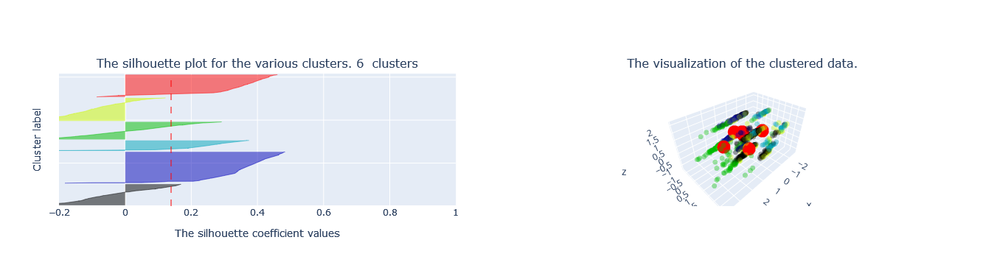

In [225]:
temp =  dataprocessed.drop(columns = ['MaritalStatus'])

flabels1 = silhouette_analysis(KPrototypes , temp , 
                    temp ,
                   [6 ], [col in gowercatcols  for col in temp.columns ],
                    use_gower_distance = False , gower_matric =True   , model_kwarg = dict(n_jobs = -1 , random_state = 7) ,
                    fit_kwarg = dict(categorical =list(map(temp.columns.get_loc , list(set(gowercatcols) & set(temp.columns)) )) ) )    

For n_clusters = 6 The average silhouette_score is : 0.18611936


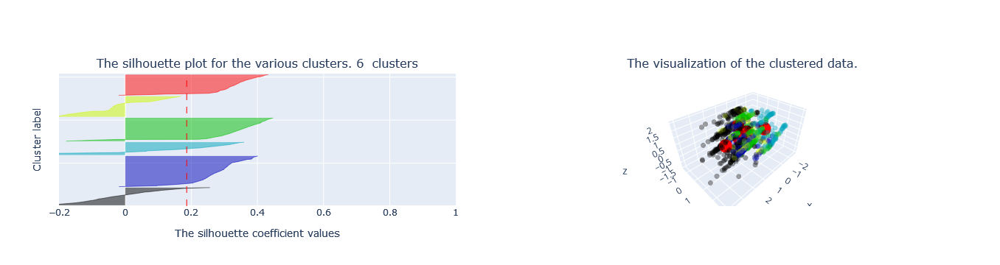

In [226]:
temp2 =  dataprocessed.drop(columns = ['Distance Between Company and Home'])

flabels2 = silhouette_analysis(KPrototypes , temp2 , 
                    temp2 ,
                   [6 ], [col in gowercatcols  for col in temp2.columns ],
                    use_gower_distance = False , gower_matric =True   , model_kwarg = dict(n_jobs = -1 , random_state = 270) ,
                    fit_kwarg = dict(categorical =list(map(temp2.columns.get_loc , list(set(gowercatcols) & set(temp2.columns)) )) ) )    

For n_clusters = 6 The average silhouette_score is : 0.15180522


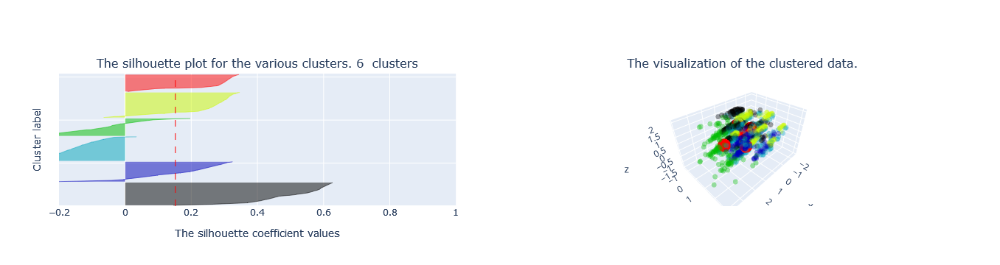

In [227]:
temp3 =  dataprocessed.drop(columns = ['Education'])

flabels3 = silhouette_analysis(KPrototypes , temp3, 
                    temp3,
                   [6 ], [col in gowercatcols  for col in temp2.columns ],
                    use_gower_distance = False , gower_matric =True   , model_kwarg = dict(n_jobs = -1  , random_state = 7) ,
                    fit_kwarg = dict(categorical =list(map(temp2.columns.get_loc , list(set(gowercatcols) & set(temp2.columns)) )) ) )    

- For n_clusters =6 , 3 feature combinations are similar to each other which is dropping Maritial Status, Distance from home or dropping Education

- Dropping distance between company and home results in the best silluolette score of 0.18 compared to the silluolette score for 0.13 and 0.15 for dropping maritial status and education respectively
- Hence , KPrototypes with dropping the Distance from home is the final model 

,Age,Resign Status,MaritalStatus,Education,Job Function,Distance Between Company and Home,Length of Service,Salary,Cluster Size (% of Total)
Clusters,,,,,,,,,
0,48.179612,No,Married,3,Research & Development,8.645631,14.305825,16009.868932,14.013605
1,36.396648,No,Married,3,Research & Development,9.502793,5.907821,4984.477654,24.353741
2,27.344371,Yes,Single,3,Research & Development,9.682119,2.907285,3128.000000,10.272109
3,37.164835,No,Single,3,Research & Development,8.703297,6.798535,5541.641026,18.571429
4,34.025000,No,Married,1,Research & Development,9.150000,6.025000,4926.845833,16.326531
5,36.702479,No,Divorced,3,Research & Development,9.487603,6.194215,5409.892562,16.462585


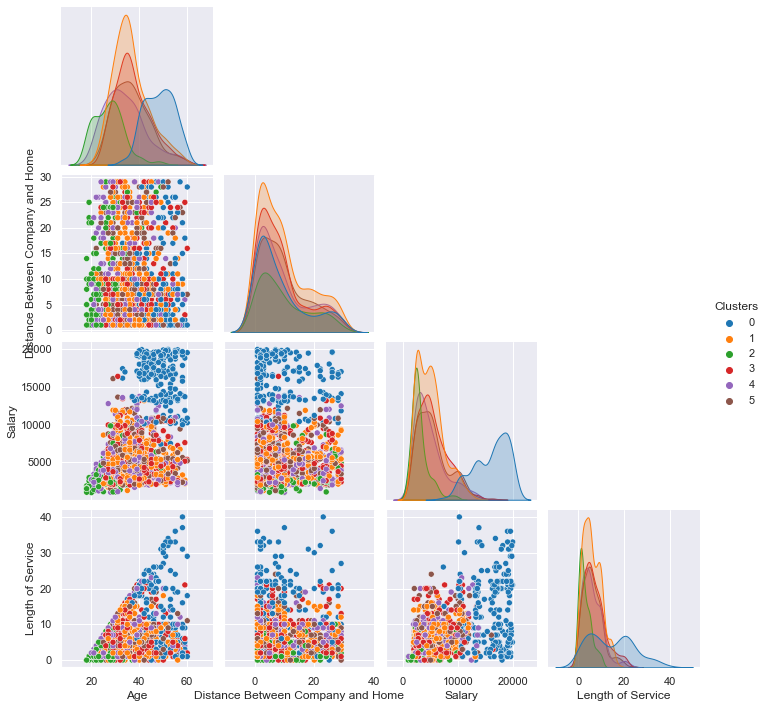

In [113]:
clusters = get_cluster_info(data, flabels2[6] , gowercatcols);

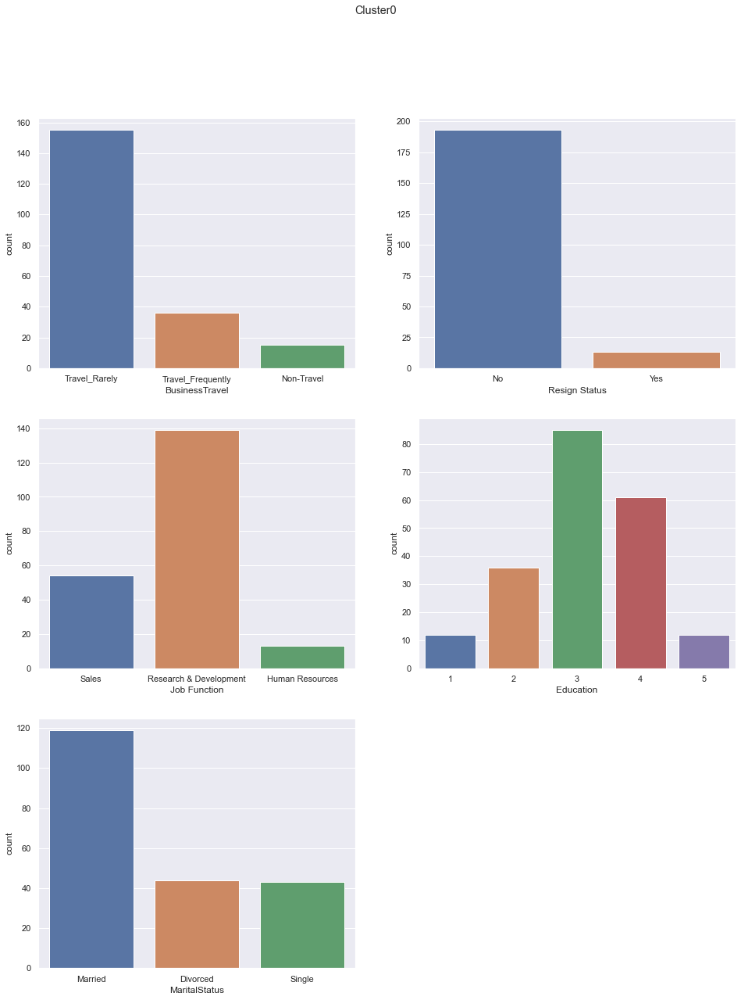

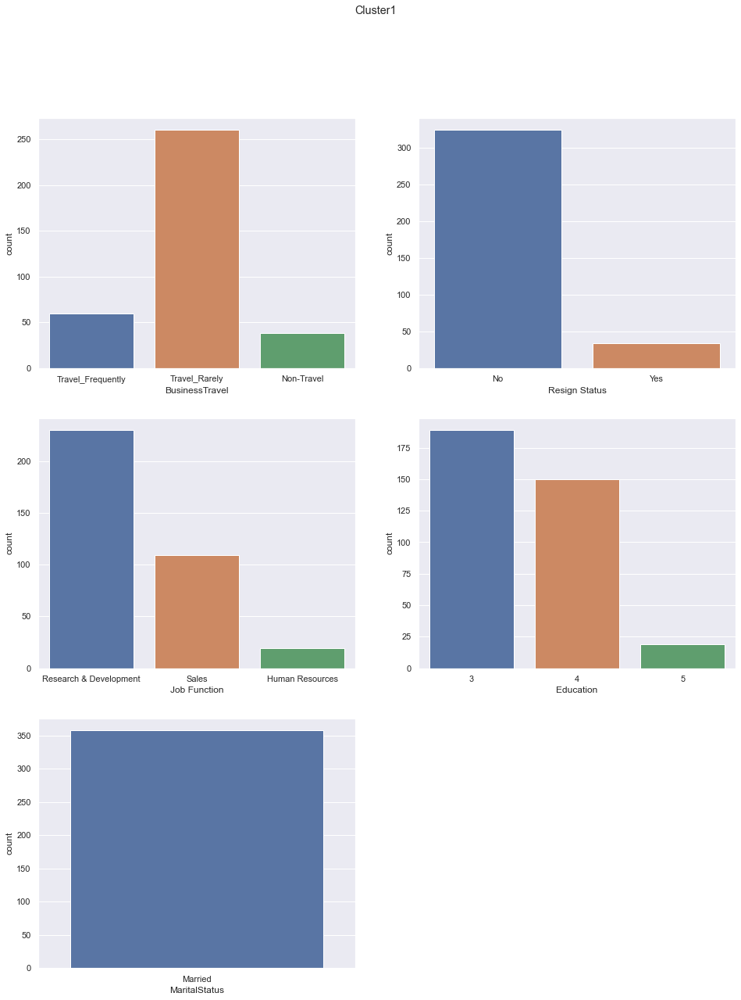

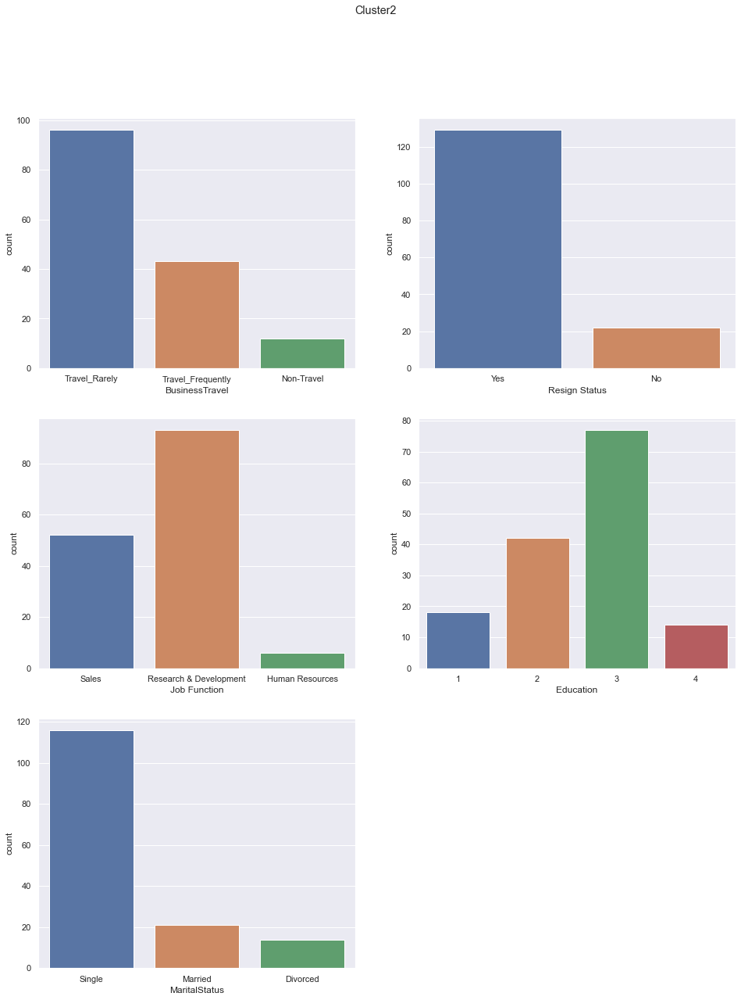

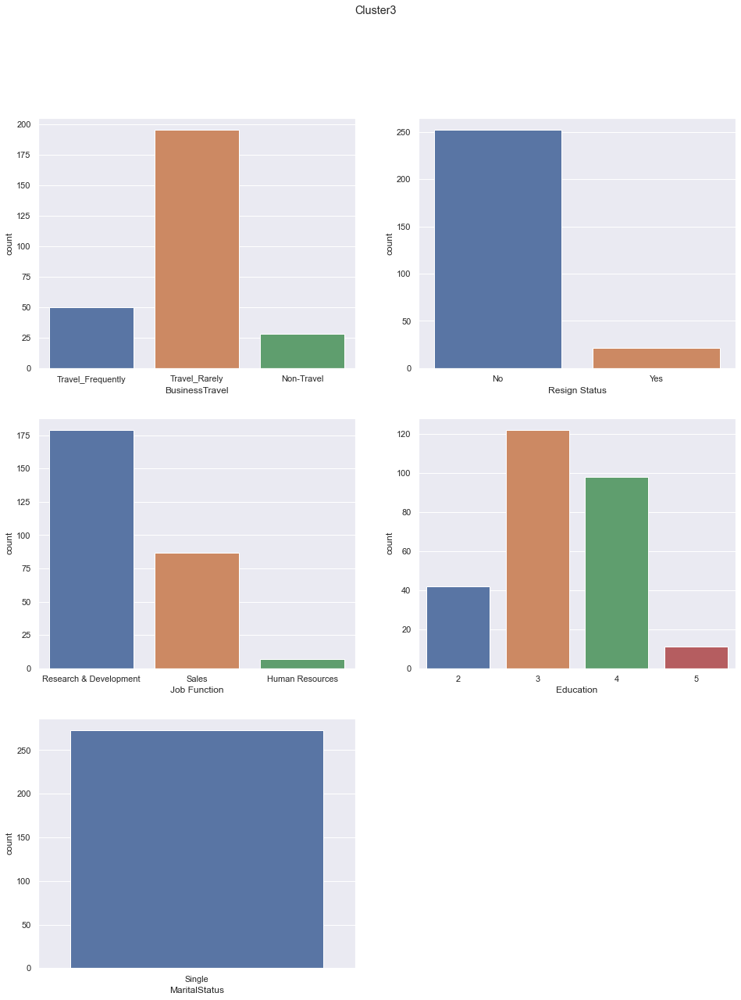

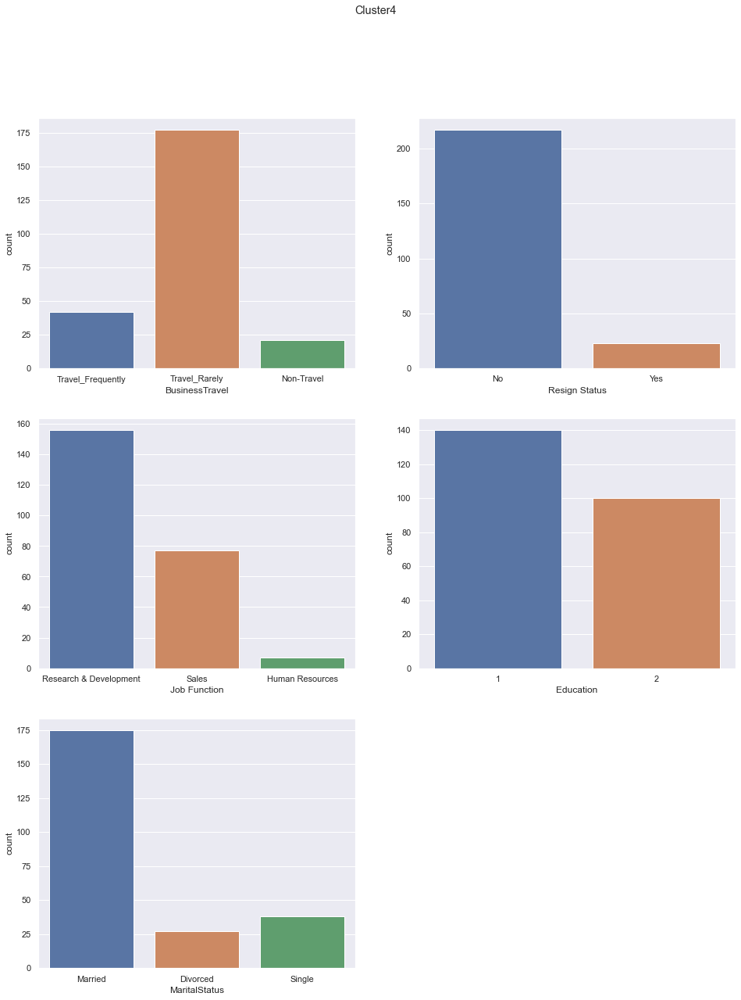

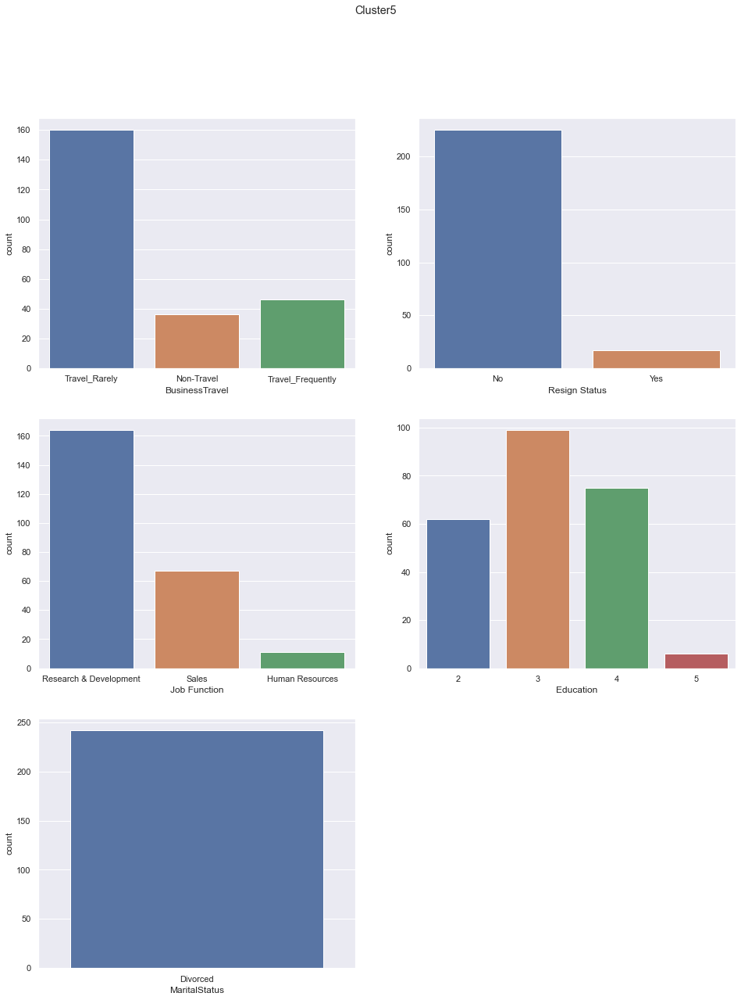

In [151]:
finaldf  = clusters.drop(columns = ['Job Satisfaction' ,    'Performance Rating'  ,   'Gender'  ,   'Work Life Balance' , 'Distance Between Company and Home'] )
discretecols2 = list( set (discretecols) & set(finaldf.columns ))

for i, clusno in enumerate(finaldf['Clusters'].sort_values().unique() ):
    temp = finaldf[finaldf['Clusters'] == clusno]
    plt.figure(figsize = (16,20))
    plt.suptitle('Cluster' + str(clusno))
    print()
    for j,discrete in enumerate(discretecols2):
        
        plt.subplot( ceil(len(discretecols2)/2) ,2   , j+1)
        sns.countplot(x  = temp[discrete] , ax = plt.gca())
    plt.show()

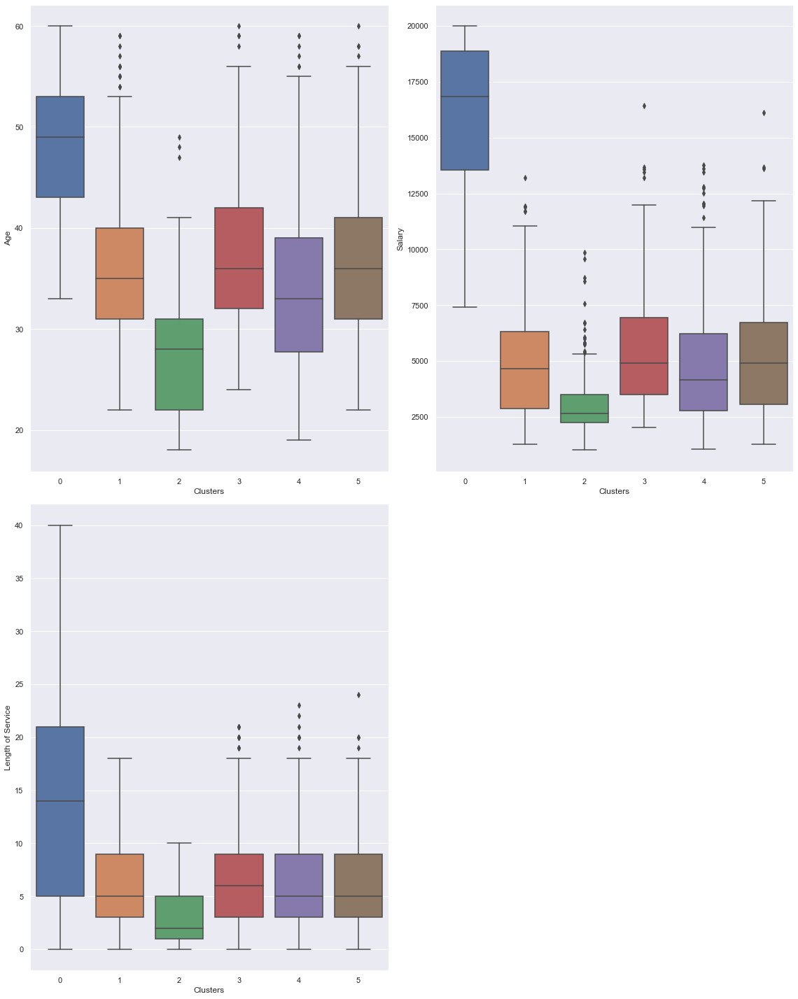

In [149]:
plt.figure(figsize = (16,20))
continuouscols2 = list( set(continuouscols).intersection(finaldf.columns))
for i, continuous in enumerate(continuouscols2):
    plt.subplot( ceil(len(continuouscols2)/2) ,2   , i+1)
    sns.boxplot(data = clusters, x = 'Clusters' , y = continuous)
plt.tight_layout()
plt.show()

# Characteristics of each cluster 

**NOTE:** Figures are rougly read from the boxplot

Cluster 0  : High paying employee  with lots of  experience
- median age is  50 years old which is older than other clusters
- Salary is significantly higher than the rest of the clusters,
- In terms of salary,  the one that earn the least in the cluster earn more than the 75% percentile of all other clusters, 
- There is a large interquatile range in the length of service, the 25% is 5 years and the 75% percentile is 20 years but all generally have a very high salary, which shows that the group generally  have work experience that gives them a high salary. 
- Considering the high salary, most of them do not resign as they are very statisfied with their high paying job 


cluster 1 : Married Employee with finanacial commitments 



- Age : Mostly from 30 to 40 years old
- length of service is median at 5 years 
-  median salary of 4900 is similar to clusters 3,4,5
-  highly educated
- They are all married showing they have family commitments hence financial commitments (house/car loan) 

- It is unlikely that those from 30 to 40 will be in their first job, and hence they might have just changed their company and as all of them are married ( financial commitments) , they will not resign and hence a large majority of this cluster does not resign


Cluster 2 :
- Mostly aged from around 22 to around 31 
-  have shortest median length of service of 2 years as they are young 
- median salary around $ 2600, which is the lowest out of all the clusters 
- Mostly Education level 3, and without education level 5 ( do not expect them to get education level 5 as they are still young ) 
- Mostly single and hence no major financial commitments  
- Hence, most of this group resigned from the company 



Cluster3 : 
- All Single
- Mostly from age 31 to 41 
- Need to a job to feed themselves and hence do not resign 
- salary of around $5000, which is actually a lot considering the employee only needs to pay for his/her own expenses, hence do not resign 


Cluster4 : 
- Not very highly educated, with only education level of 1 and 2 
- Mostly married -> have financial commitments 
- Mostly aged from around 27 to 38 
- Median Salary around $4000 which is still higher pay than cluster  showing that pay more  dependant on experience than sales 
- Most in this cluster do not resign as they have financial commitments 

Cluster 5 : 
- All in this group are divorced
- Mainly aged from 31 to 41, 
- similar salary of $5000  to the cluster 1 , 3, and 4 , showing the divorce did not really affect their job performance 
- Their Education level generally high, with mostly level 3 and 4
- They mostly do not resign as they need to feed themselves 









### Recommendations 
- Possible schemes to be adopted by the company to retain employees espescially those from cluster 2 better

> Salary
> - It is recommended for the company to offer better remuneration ( a majority of cluster 2 resigned and they have the lowest median salary) , as the median pay of $2600 for cluster 2 tends to be quite low espescially in view of high inflation rates that the world is suffering from currently. 

> Make employee feel comfortable / sense of belonging
> - Considering the young age of those who resigned from the company, it is most likely their first job and they might feel overwhelmed by the corperate/office culture and hence might not feel comfortable / sense of belonging to the company. Hence, it is recommended for them to implement an advisor system for new employees, where the advisor will guide the new employee and navigate through the company so that the new employees feel more comfortable with the company


> Career Progression
> - Can consider having some schemes in place with career progression. If they perform well, they should get a chance of promotion which increases their loyalty to company